__This notebook examines sliding window correlations of the spike rate over multiple flight rounds. Since the copter flew autonomously the bee's visual perception is similar each round. Hence, the spike rate of the bee's brain should be similar across multiple rounds as well if vision and brain activity are correlated.__

In [ ]:
import torch
import csv
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from matplotlib.gridspec import GridSpec
from scipy import interpolate

import bee_view_analyzer.DataLoader as DataLoader
import bee_view_analyzer.Correlation as Correlation
import bee_view_analyzer.Utils as Utils
import bee_view_analyzer.Visualizer as Visualizer

In [ ]:
spike_rates = []
coords = []
camera_positions = []

csv_file_path = Utils.get_path(["flights", "flight_2018_09_03#1"],
                               "030918_01_out_adc_synced.csv_spike_rates_0.1s_intervalls.csv")
spike_rates.append(DataLoader.load_neuro_data(None, csv_file_path, spike_type_row = 8, start_frame = 600))

csv_file_path = Utils.get_path(["flights", "flight_2018_09_03#2"],
                               "030918_2_out_adc_synced.csv_spike_rates_0.1s_intervalls.csv")
spike_rates.append(DataLoader.load_neuro_data(None, csv_file_path, spike_type_row = 2, start_frame = 600))

csv_file_path = Utils.get_path(["flights", "flight_2018_09_03#3"],
                               "030918_3_out_adc_synced.csv_spike_rates_0.1s_intervalls.csv")
spike_rates.append(DataLoader.load_neuro_data(None, csv_file_path, spike_type_row = 2, start_frame = 600))

csv_file_path = Utils.get_path(["flights", "flight_2018_09_03#4"],
                               "030918_4_out_adc_synced.csv_spike_rates_0.1s_intervalls.csv")
spike_rates.append(DataLoader.load_neuro_data(None, csv_file_path, spike_type_row = 2, start_frame = 600))

path = Utils.get_path(["flights", "flight_2018_09_03#1"], "coords.dill")
coords.append(Utils.load_object(path))

path = Utils.get_path(["flights", "flight_2018_09_03#2"], "coords.dill")
coords.append(Utils.load_object(path))

path = Utils.get_path(["flights", "flight_2018_09_03#3"], "coords.dill")
coords.append(Utils.load_object(path))

path = Utils.get_path(["flights", "flight_2018_09_03#4"], "coords.dill")
coords.append(Utils.load_object(path))

path = Utils.get_path(["flights", "flight_2018_09_03#1"], "camera_positions.dill")
camera_positions.append(Utils.load_object(path))

path = Utils.get_path(["flights", "flight_2018_09_03#2"], "camera_positions.dill")
camera_positions.append(Utils.load_object(path))

path = Utils.get_path(["flights", "flight_2018_09_03#3"], "camera_positions.dill")
camera_positions.append(Utils.load_object(path))

path = Utils.get_path(["flights", "flight_2018_09_03#4"], "camera_positions.dill")
camera_positions.append(Utils.load_object(path))

start_rounds = [[630, 2900, 4580],
                [743, 2390, 4070, 5770],
                [110, 1950, 3650, 5330],
                [330, 1980, 3650, 5330]]

end_rounds = [[2120, 4370, 6050],
              [2220, 3880, 5555, 7220],
              [1600, 3440, 5150, 6795],
              [1800, 3450, 5120, 6750]]

start_lines = [[[630, 1190, 1570, 1921], [2900, 3462, 3786, 4183], [4580, 5135, 5481, 5866]],
        [[743, 1300, 1630, 2025], [2390, 2965, 3310, 3700], [4070, 4640, 4970, 5370], [5770, 6315, 6665, 7050]],
        [[110, 650, 1000, 1400], [1950, 2500, 2850, 3240], [3650, 4200, 4550, 4930], [5330, 5870, 6215, 6600]],
        [[330, 870, 1200, 1590], [1980, 2530, 2870, 3250], [3650, 4200, 4530, 4920], [5330, 5870, 6220, 6480]]]

end_lines = [[[1034, 1385, 1720, 2117], [3300, 3651, 3979, 4368], [4981, 5327, 5646, 6050]],
        [[1145, 1490, 1815, 2220], [2805, 3165, 3485, 3880], [4480, 4820, 5145, 5555], [6150, 6505, 6825, 7220]],
        [[510, 870, 1200, 1600], [2350, 2720, 3050, 3440], [4070, 4420, 4750, 5150], [5740, 6070, 6420, 6795]],
        [[740, 1070, 1400, 1800], [2400, 2750, 3070, 3450], [4050, 4400, 4730, 5120], [5740, 6090, 6410, 6750]]]

flight_labels = ["03.09.2018 flight {}".format(i) for i in range(1, 5)]

path = Utils.get_path(["05_mapping"], "field_map.png")
field_map = Utils.load_object(path)

# Sliding Window Correlation: Rounds

In [ ]:
def swc_rounds(neuro_data, smoothness):
    neuro_auto_corrs = []
    neuro_auto_corrs.append(Correlation.swc(neuro_data, start_rounds[0][0], end_rounds[0][0]))
    neuro_auto_corrs.append(Correlation.swc(neuro_data, start_rounds[0][1], end_rounds[0][1]))
    neuro_auto_corrs.append(Correlation.swc(neuro_data, start_rounds[0][2], end_rounds[0][2]))

    labels = ["Round 1", "Round 2", "Round 3"]
    
    highlight_auto_corr = [start_rounds[0][0] - 10, start_rounds[0][0] + 10,
                           start_rounds[0][1] - 10, start_rounds[0][1] + 10,
                           start_rounds[0][2] - 10, start_rounds[0][2] + 10]

    Visualizer.plot(neuro_auto_corrs, labels = labels, highlight_regions = highlight_auto_corr,
                    smoothness = smoothness, show_unsmoothed_points = False)

    Visualizer.plot(neuro_auto_corrs[0], labels = labels, highlight_regions = highlight_auto_corr,
                    smoothness = 2, show_unsmoothed_points = True)

## Spike Rate

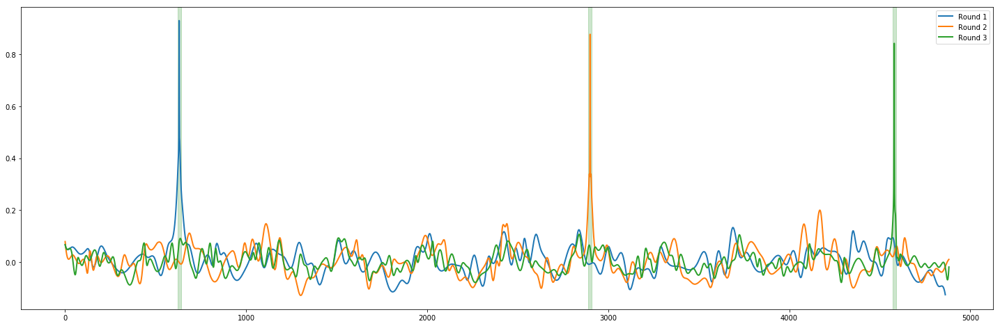

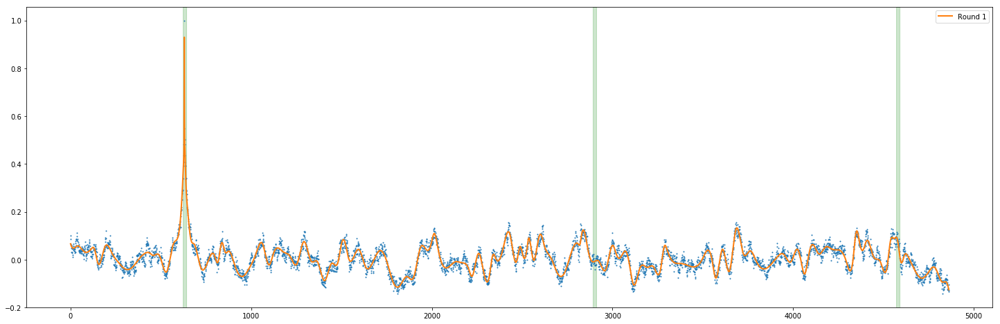

In [ ]:
swc_rounds(spike_rates[0], 2)

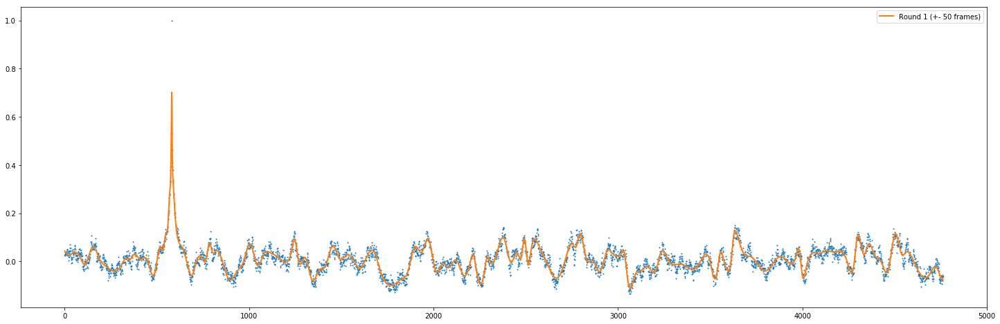

In [ ]:
labels = ["Round 1 (+- 50 frames)"]
neuro_auto_corrs = Correlation.swc(spike_rates[0], start_rounds[0][0] - 50, end_rounds[0][0] + 50)

Visualizer.plot(neuro_auto_corrs, labels = labels, smoothness = 2, show_unsmoothed_points = True)

## Derived Spike Rate

In [ ]:
spike_rate_derived = []

for i in range(1, len(spike_rates[0])):
    spike_rate_derived.append(spike_rates[0][i] - spike_rates[0][i - 1])

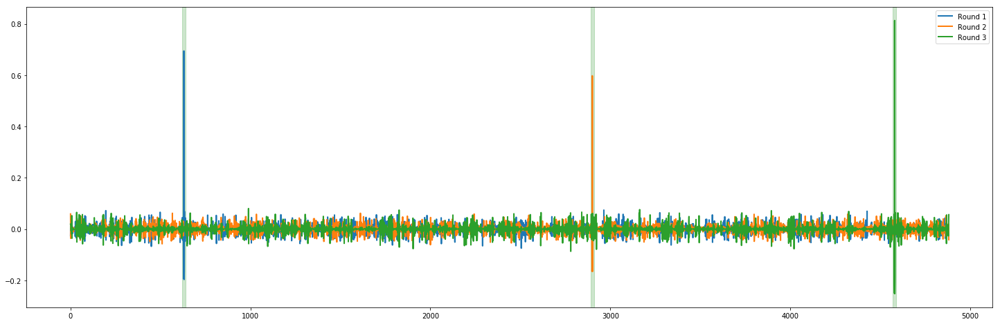

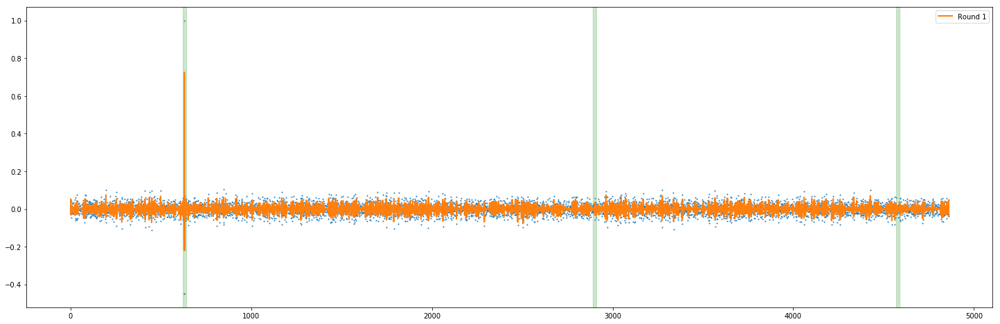

In [ ]:
swc_rounds(spike_rate_derived, 3)

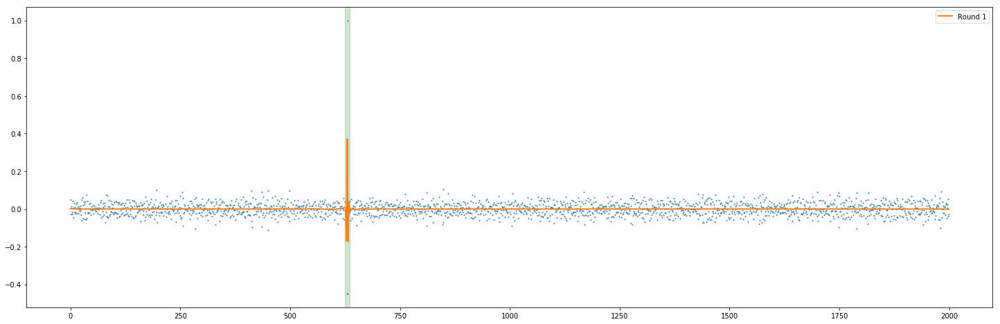

In [ ]:
corrs_derived = Correlation.swc(spike_rate_derived, start_rounds[0][0], end_rounds[0][0])

labels = ["Round 1"]

Visualizer.plot(corrs_derived[:2000], labels = labels,
                highlight_regions = [start_rounds[0][0] - 5, start_rounds[0][0] + 5],
                smoothness = 3, show_unsmoothed_points = True)

## Section of Spike Rate

Section is part of first flight line towards feeder:

Flight:


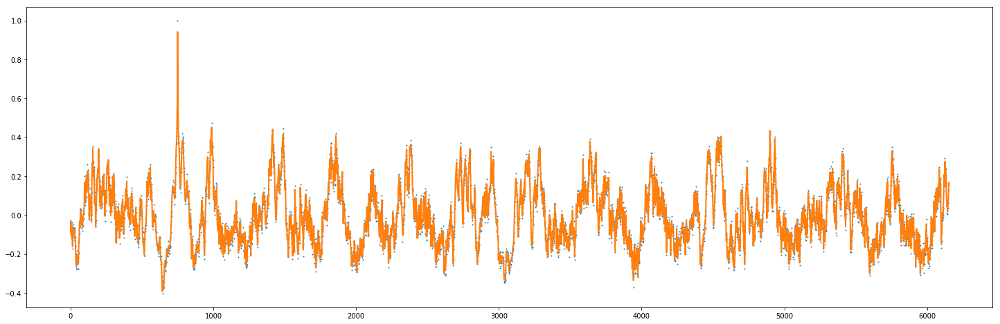

Round 1:


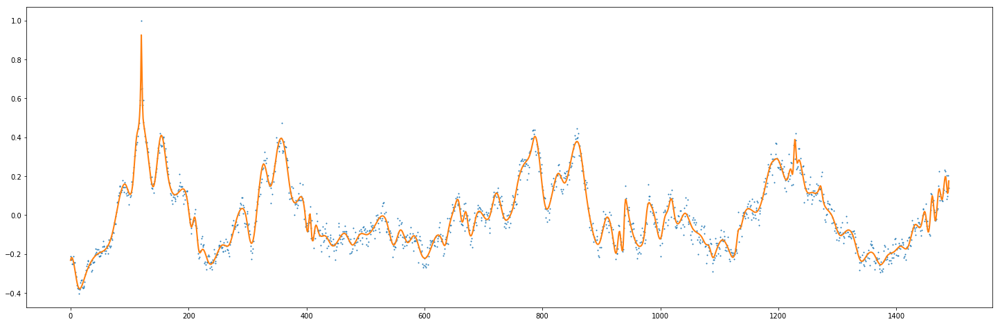

Round 2:


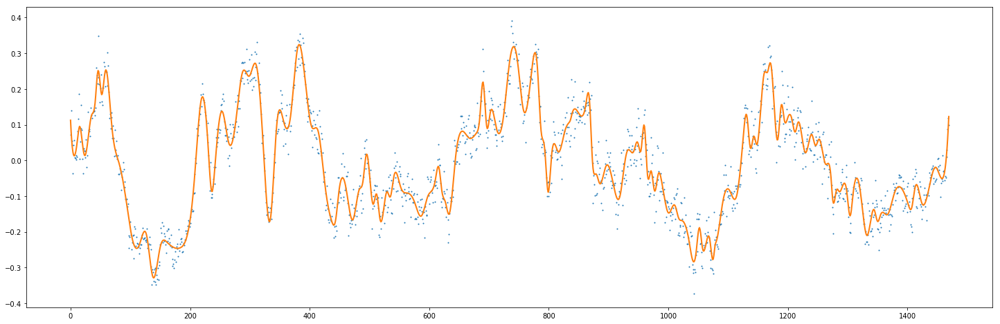

In [ ]:
corrs_section = Correlation.swc(spike_rates[0], 750, 950)

print("Flight:")
Visualizer.plot(corrs_section, smoothness = 2, show_unsmoothed_points = True)

print("Round 1:")
Visualizer.plot(corrs_section[start_rounds[0][0] : end_rounds[0][0]], smoothness = 2, show_unsmoothed_points=True)

print("Round 2:")
Visualizer.plot(corrs_section[start_rounds[0][1] : end_rounds[0][1]], smoothness = 2, show_unsmoothed_points=True)

# Time Slices: Correlation of rounds

__Correlate rounds in slices: each round is divided into fixed length parts. The first part of one round is correlated with the first part of another round, afterwards the second parts and so forth.__

In [ ]:
def get_chunks(flight_num, round_num, window_size):
    return [spike_rates[flight_num][x : x + window_size]
            for x in range(start_rounds[flight_num][round_num],
                           end_rounds[flight_num][round_num] - (window_size - 1),
                           window_size)]

def plot_correlation_rounds(flight_num, window_size, smoothness, smooth_points):    
    corrs = []
    labels = []
    
    chunks_round_1 = get_chunks(flight_num, 0, window_size)
    chunks_round_1_tensor = torch.tensor(chunks_round_1, dtype=torch.float64)
    
    for round_num in range(1, len(start_rounds[flight_num])):
        chunks_round = get_chunks(flight_num, round_num, window_size)
        chunks_round_tensor = torch.tensor(chunks_round, dtype=torch.float64)
            
        min_len = min(len(chunks_round_1_tensor), len(chunks_round_tensor))
        
        corr = Correlation._torch_pearsonr_2D_2D(chunks_round_1_tensor[ : min_len], chunks_round_tensor[: min_len])
        corr = np.nan_to_num(corr.numpy()) # replace nan by 0        
        corrs.append(corr)
        
        labels.append("Flight {}: round 0 correlation with round {}, window size {}".format(flight_num, round_num,
                                                                                            window_size))

        
    Visualizer.plot(corrs, labels = labels, smoothness = smoothness, smooth_points = smooth_points,
                    show_unsmoothed_points = True)    

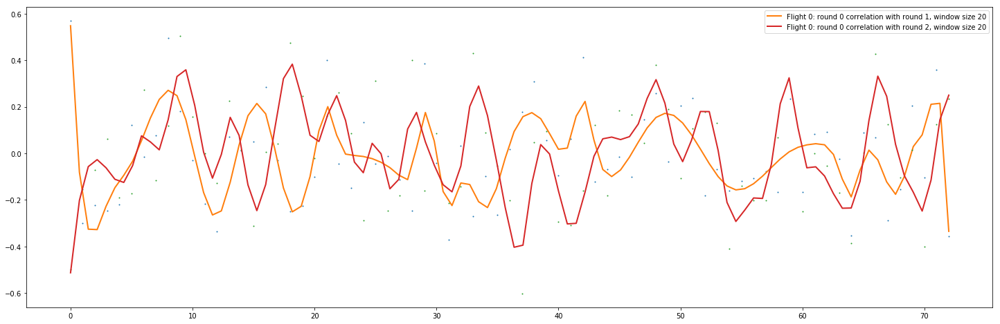

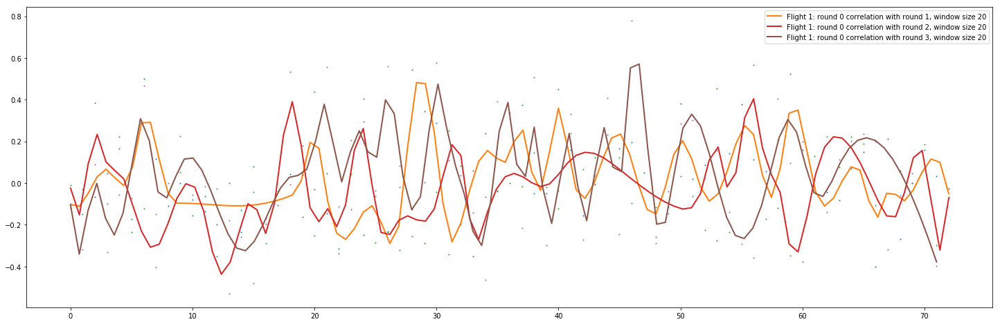

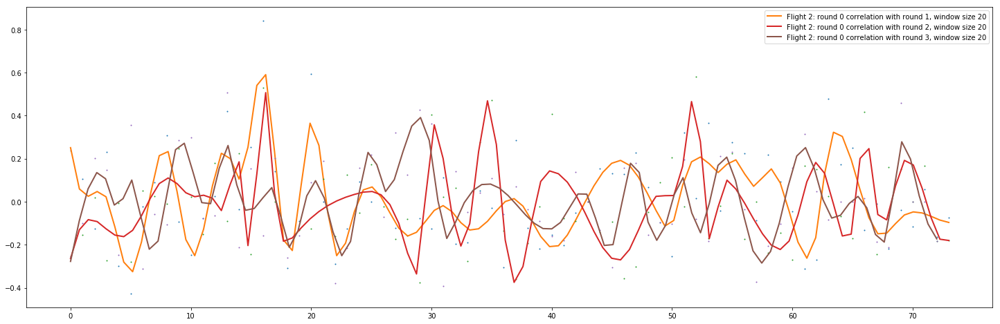

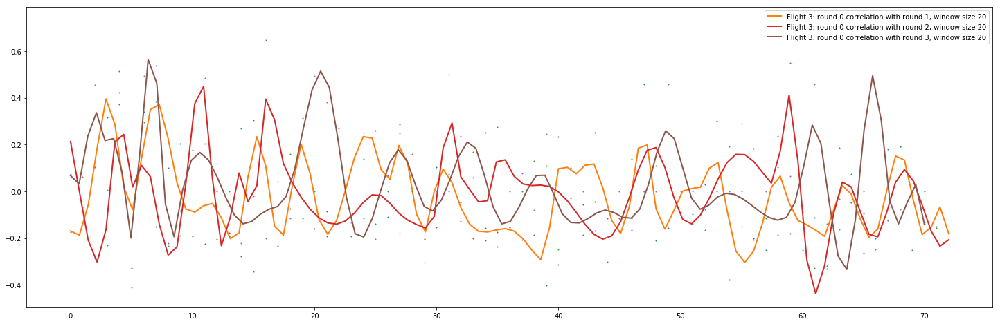

In [ ]:
window_size = 20
smoothness = 1
smooth_points = 100

plot_correlation_rounds(0, window_size, smoothness, smooth_points)
plot_correlation_rounds(1, window_size, smoothness, smooth_points)
plot_correlation_rounds(2, window_size, smoothness, smooth_points)
plot_correlation_rounds(3, window_size, smoothness, smooth_points)

# Increase bin size of spike rate

__Maybe 0.1 second interval of the spike rate is too noisy for corrrelations. Here, the spike rate is binned first (e.g. bin size of 5 means 5 consecutive 0.1 second spike rate values are summed up) in order to try to improve correlation values. Then, time slice correlations are computed with these summed spike rate values as in the previous section. In addition, a sliding window correlation is done.__

In [ ]:
def get_bin_data(flight_num, bin_size, start = 0, end = -1):
    if end == -1:
        end = len(spike_rates[flight_num])
    
    bin_chunks = [spike_rates[flight_num][x : x + bin_size] for x in range(start, end - (bin_size - 1), bin_size)]
    return np.sum(np.array(bin_chunks), 1)

def get_bin_chunks(flight_num, round_num, bin_size, window_size):
    bin_chunks = get_bin_data(flight_num, bin_size, start_rounds[flight_num][round_num], end_rounds[flight_num][round_num])
    return [bin_chunks[x : x + window_size] for x in range(0, len(bin_chunks) - (window_size - 1), window_size)]

def plot_bin_correlation_rounds(flight_num, bin_size, window_size, smoothness, smooth_points):    
    corrs = []
    labels = []
    
    chunks_round_1 = get_bin_chunks(flight_num, 0, bin_size, window_size)
    chunks_round_1_tensor = torch.tensor(chunks_round_1, dtype=torch.float64)
    
    for round_num in range(1, len(start_rounds[flight_num])):
        chunks_round = get_bin_chunks(flight_num, round_num, bin_size, window_size)
        chunks_round_tensor = torch.tensor(chunks_round, dtype=torch.float64)
        
        min_len = min(len(chunks_round_1_tensor), len(chunks_round_tensor))
        
        corr = Correlation._torch_pearsonr_2D_2D(chunks_round_1_tensor[ : min_len], chunks_round_tensor[ : min_len])
        corr = np.nan_to_num(corr.numpy()) # replace nan by 0        
        corrs.append(corr)
        
        labels.append("Flight {}: round 0 correlation with round {}, window size {}, bin size {}".format(flight_num, round_num, window_size, bin_size))

        
    Visualizer.plot(corrs, labels = labels)
    Visualizer.plot(corrs, labels = labels, smoothness = smoothness, smooth_points = smooth_points, show_unsmoothed_points = True)
    
def bin_swc(flight_num, bin_size, smoothness, smooth_points, labels = None):
    bin_data = get_bin_data(flight_num, bin_size)
    
    corrs = Correlation.swc(bin_data, start_rounds[flight_num][0] // bin_size, end_rounds[flight_num][0] // bin_size)
    
    margin = 3    
    highlight = []
    
    for round_num in range(len(start_rounds[flight_num])):
        highlight.append((start_rounds[flight_num][round_num] // bin_size) - margin)
        highlight.append((start_rounds[flight_num][round_num] // bin_size) + margin)
    
    Visualizer.plot(corrs, labels = labels, highlight_regions = highlight)
    Visualizer.plot(corrs, labels = labels, highlight_regions = highlight, smoothness = smoothness,
                    smooth_points = smooth_points, show_unsmoothed_points = True)

## Time Slices

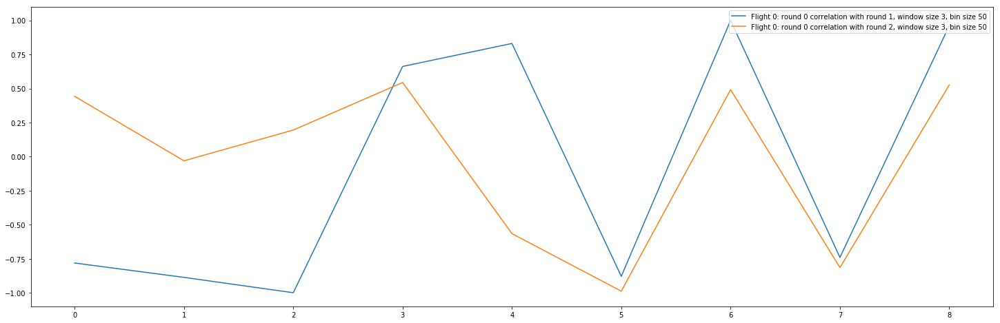

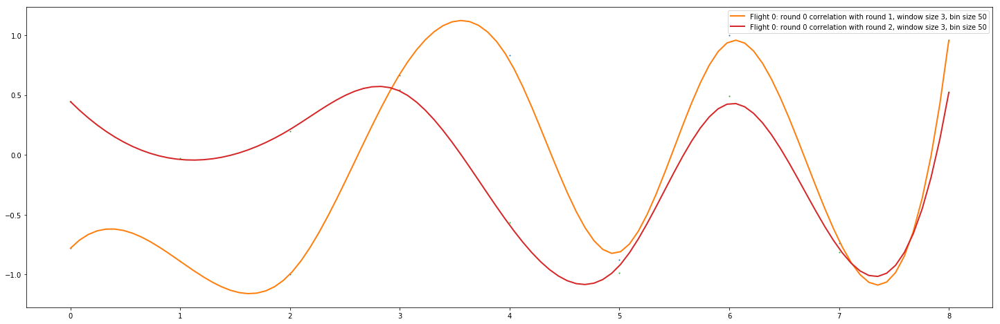

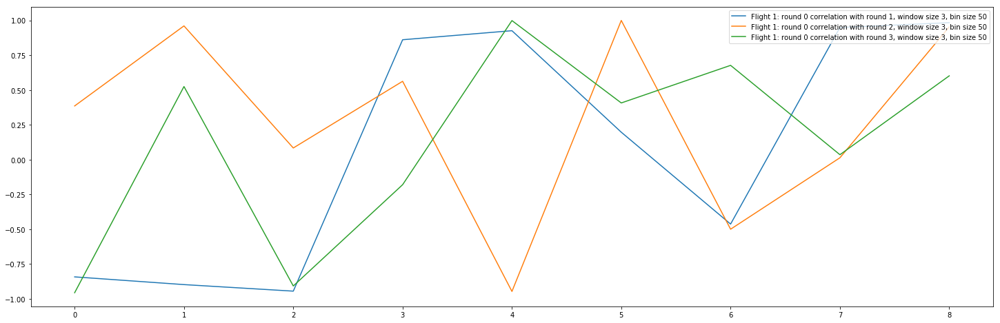

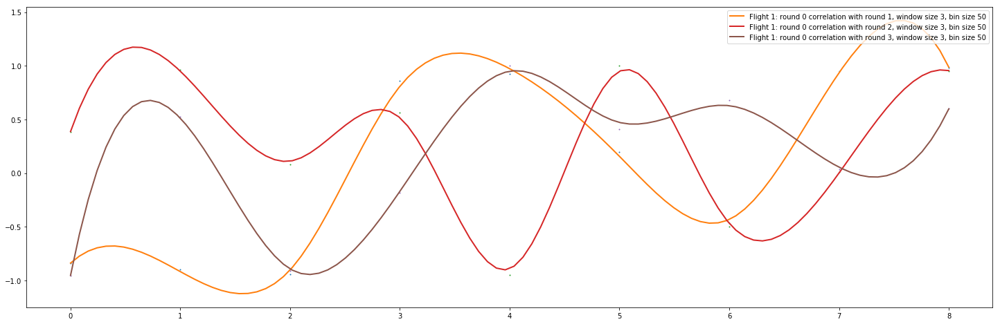

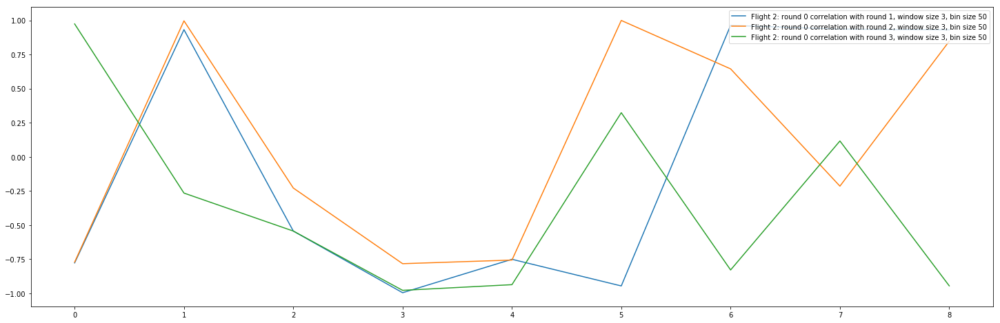

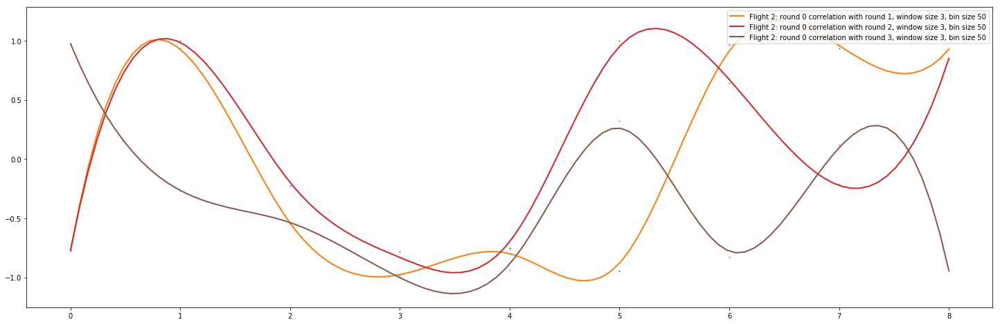

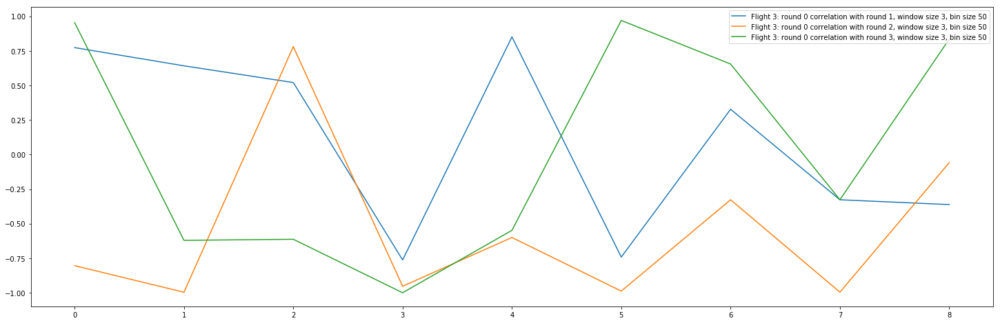

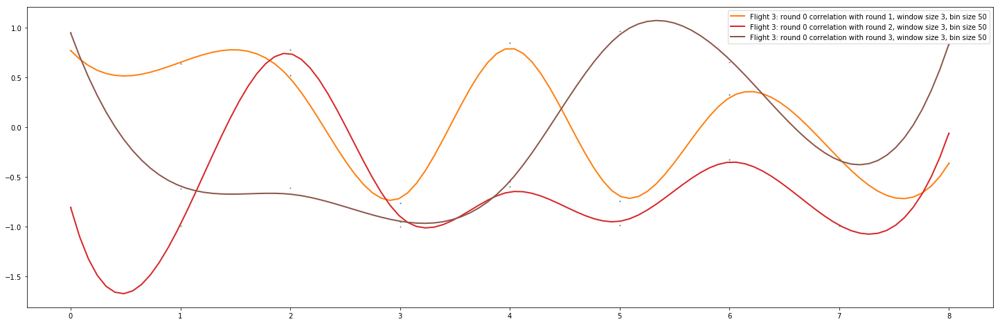

In [ ]:
window_size = 3
bin_size = 50
smoothness = 0.01
smooth_points = 100

plot_bin_correlation_rounds(0, bin_size, window_size, smoothness, smooth_points)
plot_bin_correlation_rounds(1, bin_size, window_size, smoothness, smooth_points)
plot_bin_correlation_rounds(2, bin_size, window_size, smoothness, smooth_points)
plot_bin_correlation_rounds(3, bin_size, window_size, smoothness, smooth_points)

## Sliding Window Correlation

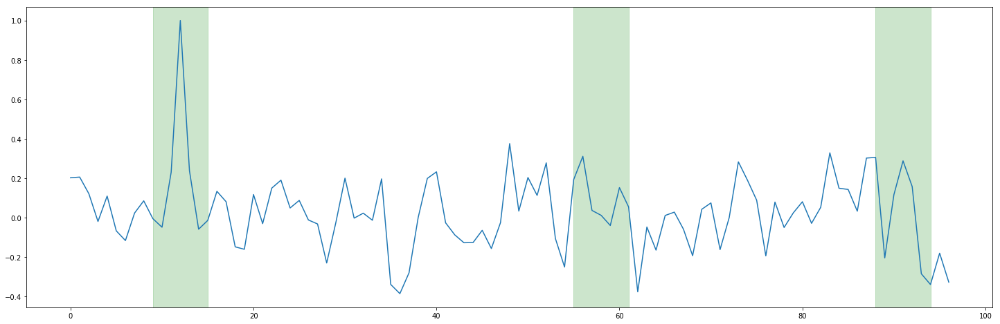

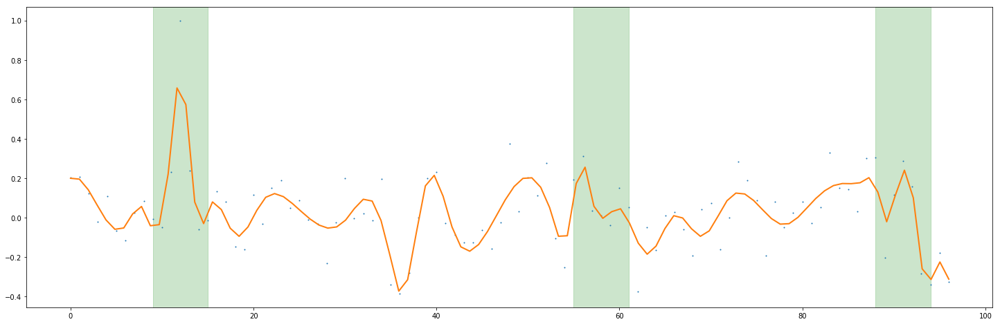

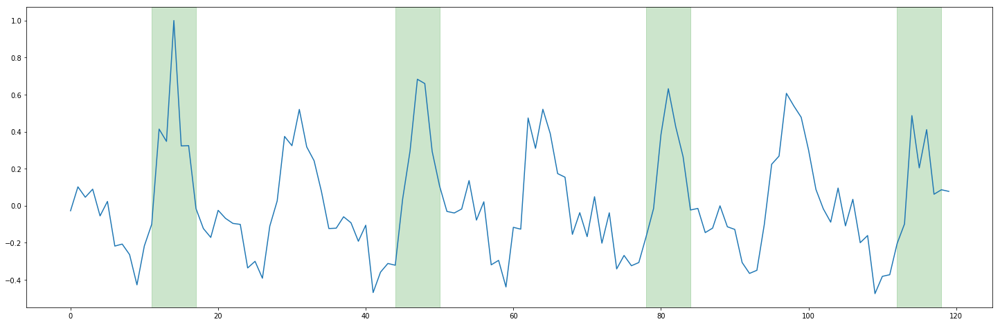

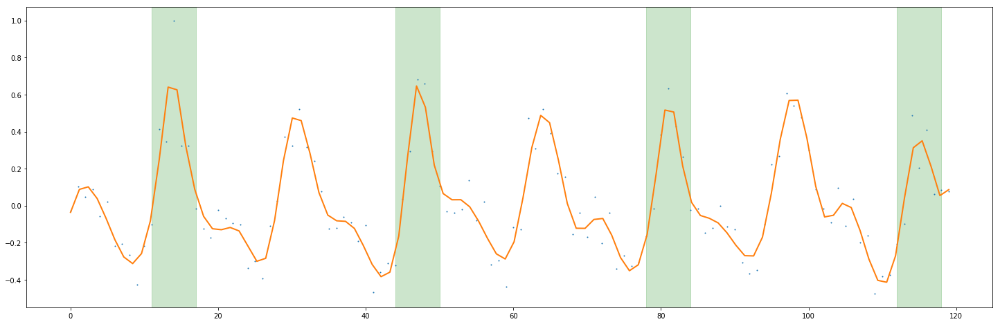

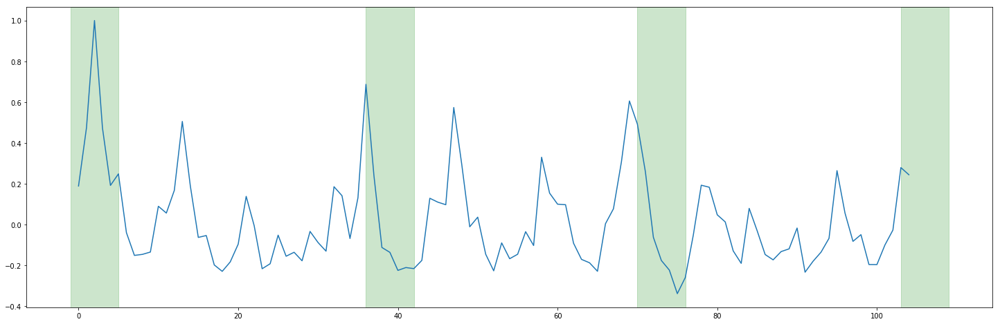

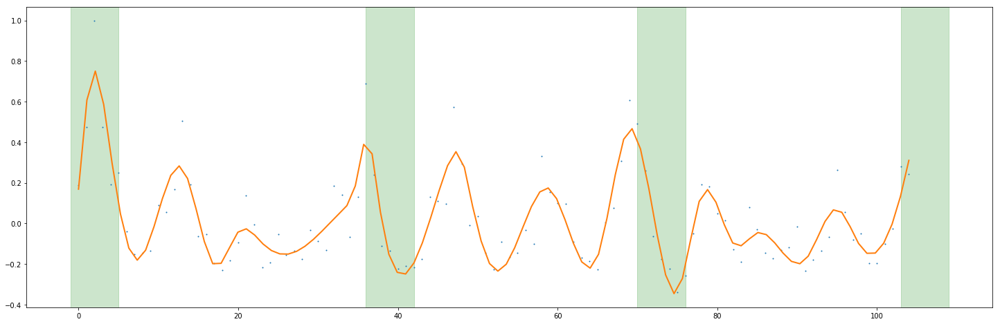

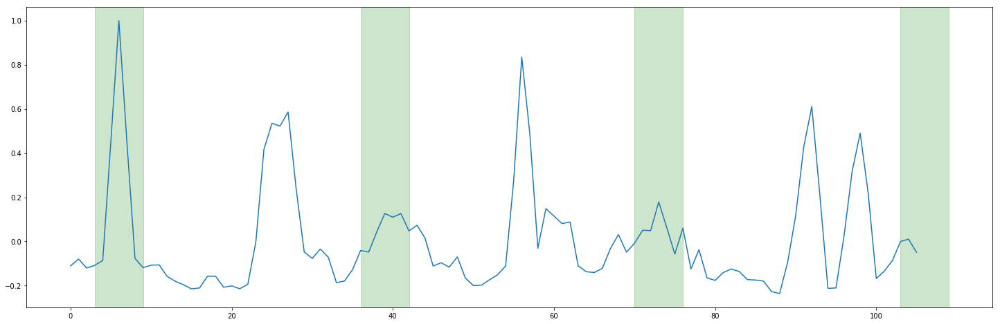

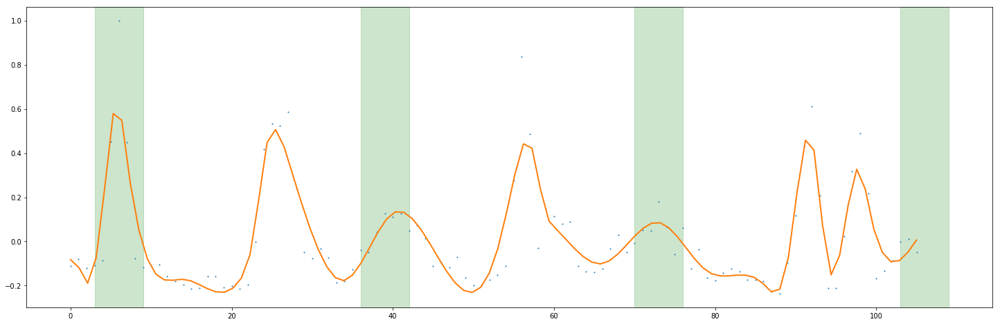

In [ ]:
bin_size = 50

bin_swc(0, bin_size, 1, 100)
bin_swc(1, bin_size, 1, 100)
bin_swc(2, bin_size, 1, 100)
bin_swc(3, bin_size, 1, 100)

# Correction of different lengths of rounds

__To further improve correlation results the spike rate of different flight rounds is location synchronized in this section. Spike rate values are not binned via time but via their location where they were triggered, e.g. in 10 meter parts. This is possible since the copter recorded GPS positions while flying along with the bee's brain activity.__

In [ ]:
def get_points(camera_positions, flight_num):
    points = []
    
    for i in range(len(camera_positions[flight_num])):
        points.append([camera_positions[flight_num][i][0], camera_positions[flight_num][i][2]])
    
    return points

# mean points fixed every 'distance' meter
def create_mean_parts(distance, points, neuro_data, flight_num):
    dst = np.linalg.norm(np.array(points[ : -1]) - np.array(points[1 : ]), axis = 1)

    ordered_points = []
    mean_points = []

    ordered_neuro = []

    current_distance = 0
    current_mean = None
    current_point_list = [points[0]]
    current_neuro_list = [neuro_data[flight_num][0]]

    half_distance = distance / 2
    p = 0

    for i in range(1, min(len(points), len(neuro_data[flight_num]))):
        dist = dst[i - 1]
        current_distance += dist
        
        if current_mean is None and current_distance > half_distance:                
            current_element = np.array(points[i])
            prev_element = np.array(current_point_list[-1])
            dst_to_prev =  np.linalg.norm(current_element - prev_element)
                
            p = ((current_distance - half_distance) / dst_to_prev)
            current_mean = current_element + (prev_element - current_element) * p

        if current_distance > distance:            
            mean_points.append(current_mean)
            current_mean = None

            ordered_points.append(current_point_list)
            ordered_neuro.append(current_neuro_list)
            
            current_distance -= distance

            current_point_list = [points[i]]
            current_neuro_list = [neuro_data[flight_num][i]]
        else:
            current_point_list.append(points[i])
            current_neuro_list.append(neuro_data[flight_num][i])
                
            
    return ordered_points, mean_points, ordered_neuro

# mean points are mean of all points in 'distance' meter
def create_mean_parts_alt(distance, points, neuro_data, flight_num):
    dst = np.linalg.norm(np.array(points[ : -1]) - np.array(points[1 : ]), axis = 1)

    ordered_points = []
    mean_points = []

    ordered_neuro = []

    current_distance = 0
    current_point_list = [points[0]]
    current_neuro_list = [neuro_data[flight_num][0]]

    p = 0

    for i in range(1, min(len(camera_positions[flight_num]), len(neuro_data[flight_num]))):
        dist = dst[i - 1]

        if current_distance + dist > distance:
            len_current_points = len(current_point_list)

            if len(ordered_points) > 0:
                current_element = np.array(current_point_list[0])
                prev_element = np.array(ordered_points[-1][-1])

                meanToPrev = current_element + (prev_element - current_element) * (1 - p)
                current_point_list = [meanToPrev] + current_point_list

            nextElement = np.array(points[i])        
            currentElement = np.array(current_point_list[-1])

            p = ((distance - current_distance) / dist)

            meanToNext = currentElement + (nextElement - currentElement) * p
            
            current_point_list.append(meanToNext)

            mean_index = (i - 1) - (len_current_points / 2)
            mean = np.mean(np.array(current_point_list), axis = 0)
            mean_points.append(mean)

            start = 0 if len(ordered_points) == 0 else 1        
            ordered_points.append(current_point_list[start : -1])
            ordered_neuro.append(current_neuro_list)
            
            current_distance = current_distance + dist - distance

            current_point_list = [points[i]]
            current_neuro_list = [neuro_data[flight_num][i]]
        else:
            current_distance += dist
            current_point_list.append(points[i])
            current_neuro_list.append(neuro_data[flight_num][i])
            
    return ordered_points, mean_points, ordered_neuro

def draw_mean_points(points):
    delta_x = 187 # distance to leftmost x-coordinate from origin on field
    delta_y = 297 # distance to topmost y-coordinate from origin on field
    
    img_map = np.full((355, 258), np.nan)
        
    round_started = False
    i = -1
    for point in points:
        i += 1
        
        x = int(delta_x + np.around(point[0]))
        y = int(delta_y - np.around(point[1]))

        if y < 0 or x < 0 or y >= img_map.shape[0] or x >= img_map.shape[1]:
            if round_started:
                break
                
            continue

        img_map[y, x] = 1
        
        if y < 300:
            round_started = True
        
    figure(figsize = (15,15))
    plt.imshow(img_map)
    
def draw_round_points(points):
    delta_x = 187 # distance to leftmost x-coordinate from origin on field
    delta_y = 297 # distance to topmost y-coordinate from origin on field
    
    img_map = np.full((355, 258), np.nan)
    
    for part_num in range(len(points)):
        for point in points[part_num]:
            x = int(delta_x + np.around(point[0]))
            y = int(delta_y - np.around(point[1]))

            img_map[y, x] = 1 if part_num % 2 == 0 else 2
        
    figure(figsize = (15,15))
    plt.imshow(img_map)
    
def _drop_wrong_rounds(start_frames, end_frames):
    if len(start_frames) > len(end_frames):
        start_frames = start_frames[ : -1]

    round_lengths = np.array(end_frames) - np.array(start_frames)
    median = np.median(round_lengths)

    starts = []
    ends = []
    for i in range(len(round_lengths)):
        if round_lengths[i] > 0.7 * median:
            starts.append(start_frames[i])
            ends.append(end_frames[i])
            
    return starts, ends

def get_round_start_end(camera_positions, flight_num = -1):
    delta_x = 187 # distance to leftmost x-coordinate from origin on field
    delta_y = 297 # distance to topmost y-coordinate from origin on field
    
    starts = []
    ends = []
    
    for flight_number in range(len(camera_positions)):
        if flight_num >= 0 and flight_number != flight_num:
            continue
        
        start_frames = []
        end_frames = []

        round_flying = False

        for i in range(len(camera_positions[flight_number])):
            x = int(delta_x + np.around(camera_positions[flight_number][i][0]))
            y = int(delta_y - np.around(camera_positions[flight_number][i][2]))

            # y > 330 to get last rounds of flights where drone does not always move out of visible map
            if not round_flying and y < 330 and x < 258:
                round_flying = True
                start_frames.append(i)
            elif round_flying and y >= 330 or x >= 258:
                round_flying = False
                end_frames.append(i)
        
        start_frames, end_frames = _drop_wrong_rounds(start_frames, end_frames)
        
        if flight_num >= 0:
            return start_frames, end_frames
        
        starts.append(start_frames)
        ends.append(end_frames)
    
    return starts, ends
            
def get_base_round(round_num, start_frames, end_frames, ordered_points, mean_points, ordered_neuro):
    current_frame_num = 0
    mean_start_index = -1
    mean_end_index = -1
    base_neuro = []
    
    for part_num in range(len(ordered_points)):
        current_frame_num += len(ordered_points[part_num])
        
        if mean_start_index == -1 and current_frame_num >= start_frames[round_num]:
            mean_start_index = part_num
            mean_part_start = start_frames[round_num] - current_frame_num
        elif mean_end_index == -1 and current_frame_num >= end_frames[round_num]:
            mean_end_index = part_num
            mean_part_end = end_frames[round_num] - current_frame_num
            break
    
    round_points = ordered_points[mean_start_index : mean_end_index + 1]
    round_points[0] = round_points[0][mean_part_start : ]
    
    
    round_neuro = ordered_neuro[mean_start_index : mean_end_index + 1]
    round_neuro[0] = round_neuro[0][mean_part_start : ]
    
    if mean_part_end != 0:
        round_points[-1] = round_points[-1][ : mean_part_end]
        round_neuro[-1] = round_neuro[-1][ : mean_part_end]
    
    round_mean_points = mean_points[mean_start_index : mean_end_index + 1]
    #tree = spatial.KDTree(round_mean_points)
    
    return round_points, round_mean_points, round_neuro

def match_round(round_num, start_frames, end_frames, points, base_round_mean, neuro_data):
    round_points = [[] for i in range(len(base_round_mean))]
    round_neuro_data = [[] for i in range(len(base_round_mean))]
    
    current_mean_index = 0
    
    for i in range(start_frames[round_num], end_frames[round_num]):        
        if current_mean_index + 1 < len(base_round_mean):
            current_distance = np.linalg.norm(points[i] - base_round_mean[current_mean_index])
            next_distance = np.linalg.norm(points[i] - base_round_mean[current_mean_index + 1])

            if next_distance < current_distance:
                current_mean_index += 1
            
        round_points[current_mean_index].append(points[i])
        round_neuro_data[current_mean_index].append(neuro_data[i])
        
    return round_points, round_neuro_data

def match_rounds(flight_num, start_frames, end_frames, points, base_round_mean, neuro_data):
    matched_round_points = []
    matched_round_neuro_data = []

    for round_num in range(len(start_frames)):
        matched_round, matched_neuro = match_round(round_num, start_frames, end_frames, points, base_round_mean,
                                                   neuro_data[flight_num])

        matched_round_points.append(matched_round)
        matched_round_neuro_data.append(matched_neuro)
        
    return matched_round_points, matched_round_neuro_data

def _enlarge_series(series, diff):
    if len(series) > 0:
        mean = np.mean(series)
    else:
        mean = 0
    
    middle = len(series) // 2    
    return np.insert(series, middle, [mean] * np.abs(diff))

def equalize_round_lengths(base_neuro, matched_rounds_neuro):
    equalized_base_round_neuro = [base_neuro.copy() for i in range(len(matched_rounds_neuro))]
    
    for round_num in range(len(matched_rounds_neuro)):
        for part_num in range(len(matched_rounds_neuro[round_num])):
            diff = len(equalized_base_round_neuro[round_num][part_num]) - len(matched_rounds_neuro[round_num]
                                                                                                  [part_num])
            
            if diff < 0:
                series = _enlarge_series(equalized_base_round_neuro[round_num][part_num], diff)
                equalized_base_round_neuro[round_num][part_num] = series
            elif diff > 0:
                series = _enlarge_series(matched_rounds_neuro[round_num][part_num], diff) 
                matched_rounds_neuro[round_num][part_num] = series
                
    return equalized_base_round_neuro, matched_rounds_neuro

def correlate_rounds(base_round_neuro, matched_round_neuro_data):
    corrs = []
    
    for round_num in range(len(base_round_neuro)):
        corr_round = []
        
        for part_num in range(len(base_round_neuro[round_num])):
            corr = Correlation.correlate_series(base_round_neuro[round_num][part_num],
                                                matched_round_neuro_data[round_num][part_num])
            corr_round.append(corr)
            
        corrs.append(corr_round)
        
    return corrs

__Create a mean point every 10 meters and draw one round of them:__

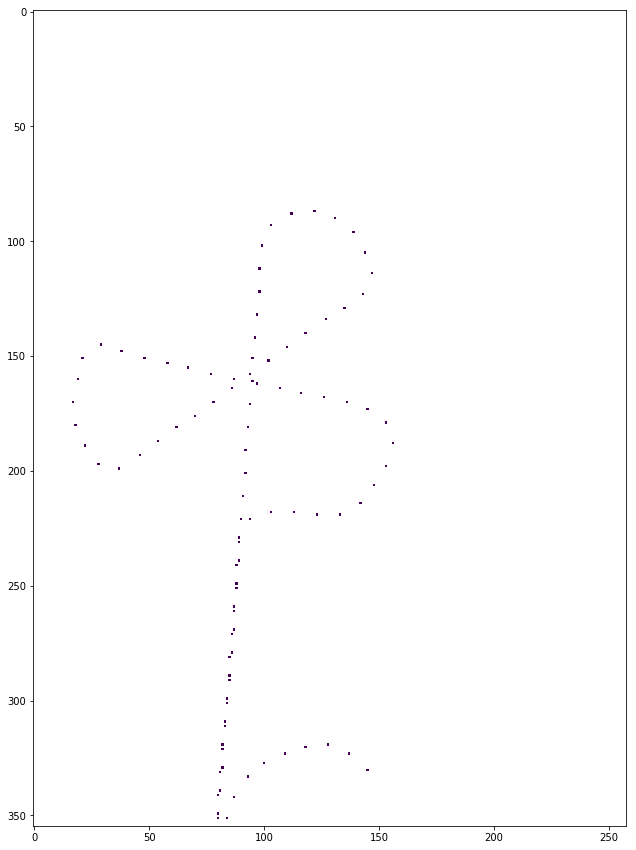

In [ ]:
flight_num = 0
points = get_points(camera_positions, flight_num)

ordered_points, mean_points, ordered_neuro = create_mean_parts(10, points, spike_rates, 0)
draw_mean_points(mean_points)

In [ ]:
start_frames, end_frames = get_round_start_end(camera_positions, flight_num)

base_round_num = 0

base_round_points, base_round_mean, base_round_neuro = get_base_round(base_round_num, start_frames, end_frames,
                                                                      ordered_points, mean_points, ordered_neuro)

__Take one round as a base round and use its mean points. Assign spike rates to nearest mean points and color locations of spike rate values assigned to every other mean point in different colors:__

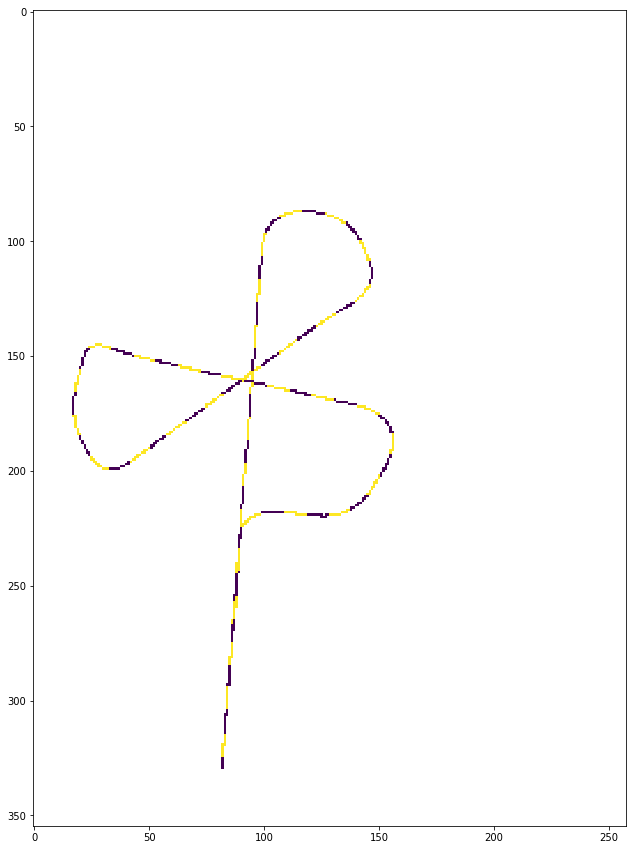

In [ ]:
draw_round_points(base_round_points)

__Match lcoations of spike rate values of another round to nearest mean points of base round. Color spike rate values assigned to every other mean point again in different colors. This serves as a sanity check to see that spike rate values are properly matched.__

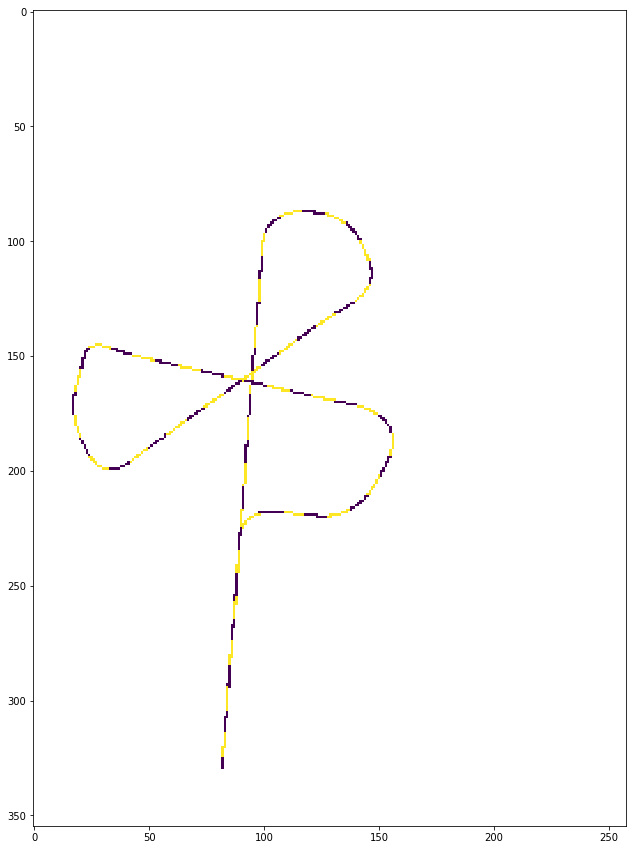

In [ ]:
matched_round_points, matched_round_neuro_data = match_rounds(flight_num, start_frames, end_frames, points,
                                                              base_round_mean, spike_rates)

draw_round_points(matched_round_points[1])

In [ ]:
eq_base_round_neuro, eq_matched_round_neuro = equalize_round_lengths(base_round_neuro, matched_round_neuro_data)
corrs = correlate_rounds(eq_base_round_neuro, eq_matched_round_neuro)

## Time Slices

In [ ]:
def get_vmin_vmax(data):
    u = np.nanmean(data)
    std = np.nanstd(data)
    
    vmin = u - 2 * std
    vmax = u + 2 * std
    
    return vmin, vmax

def map_round(ax, field_map, neuro_data, camera_positions, flight_num, round_num,
              start_frames, end_frames, show_colorbar = True):
    delta_x = 187 # distance to leftmost x-coordinate from origin on field
    delta_y = 297 # distance to topmost y-coordinate from origin on field
    
    ax.imshow(field_map / 4)
    
    overlay = np.full((field_map.shape[0], field_map.shape[1]), np.nan)
    
    for frame_num in range(start_frames[round_num], end_frames[round_num]):
        camera = camera_positions[flight_num][frame_num]
        neuro = neuro_data[flight_num][frame_num]
        
        x = int(delta_x + camera[0])
        y = int(delta_y - camera[2])
        
        overlay[y, x] = neuro
        
    current_cmap = matplotlib.cm.get_cmap()
    current_cmap.set_bad(alpha=0)
    
    vmin, vmax = get_vmin_vmax(overlay)
    im = ax.imshow(overlay, vmin = vmin, vmax = vmax)
    
    if show_colorbar:
        plt.colorbar(im)
        
    return overlay

def map_time_slices(ax, field_map, matched_round_points, corrs, round_num, show_colorbar = True):
    delta_x = 187 # distance to leftmost x-coordinate from origin on field
    delta_y = 297 # distance to topmost y-coordinate from origin on field
    
    ax.imshow(field_map / 4)
    
    corr_overlay = np.full((field_map.shape[0], field_map.shape[1]), np.nan)
    
    for part_num in range(len(matched_round_points[round_num])):
        corr = corrs[round_num][part_num]
        
        for point in matched_round_points[round_num][part_num]:
            x = int(delta_x + point[0])
            y = int(delta_y - point[1])
            
            corr_overlay[y, x] = corr
        
    current_cmap = matplotlib.cm.get_cmap()
    current_cmap.set_bad(alpha=0)    
    
    vmin, vmax = get_vmin_vmax(corr_overlay)
    im = ax.imshow(corr_overlay, vmin = vmin, vmax = vmax)
    
    if show_colorbar:
        plt.colorbar(im)
        
    return corr_overlay
        
def plot_synced_time_slices(camera_positions, flight_num, base_round_num, distance, smoothness = 1,
                            smooth_points = 100):
    
    points = get_points(camera_positions, flight_num)
    start_frames, end_frames = get_round_start_end(camera_positions, flight_num)
    ordered_points, mean_points, ordered_neuro = create_mean_parts(distance, points, spike_rates, flight_num)
    
    base_round_points, base_round_mean, base_round_neuro = get_base_round(base_round_num, start_frames,
                                                                          end_frames, ordered_points, mean_points,
                                                                          ordered_neuro)
    
    matched_round_points, matched_round_neuro_data = match_rounds(flight_num, start_frames, end_frames, points,
                                                                  base_round_mean, spike_rates)
    
    eq_base_round_neuro, eq_matched_round_neuro = equalize_round_lengths(base_round_neuro,
                                                                         matched_round_neuro_data)
    
    corrs = correlate_rounds(eq_base_round_neuro, eq_matched_round_neuro)
    
    labels = ["Round 1", "Round 2", "Round 3"]
    
    Visualizer.plot(corrs, labels = labels)
    Visualizer.plot(corrs, labels = labels, smoothness = smoothness, smooth_points = smooth_points)

__Show correlations in time slices on a flight trajectory on the field:__

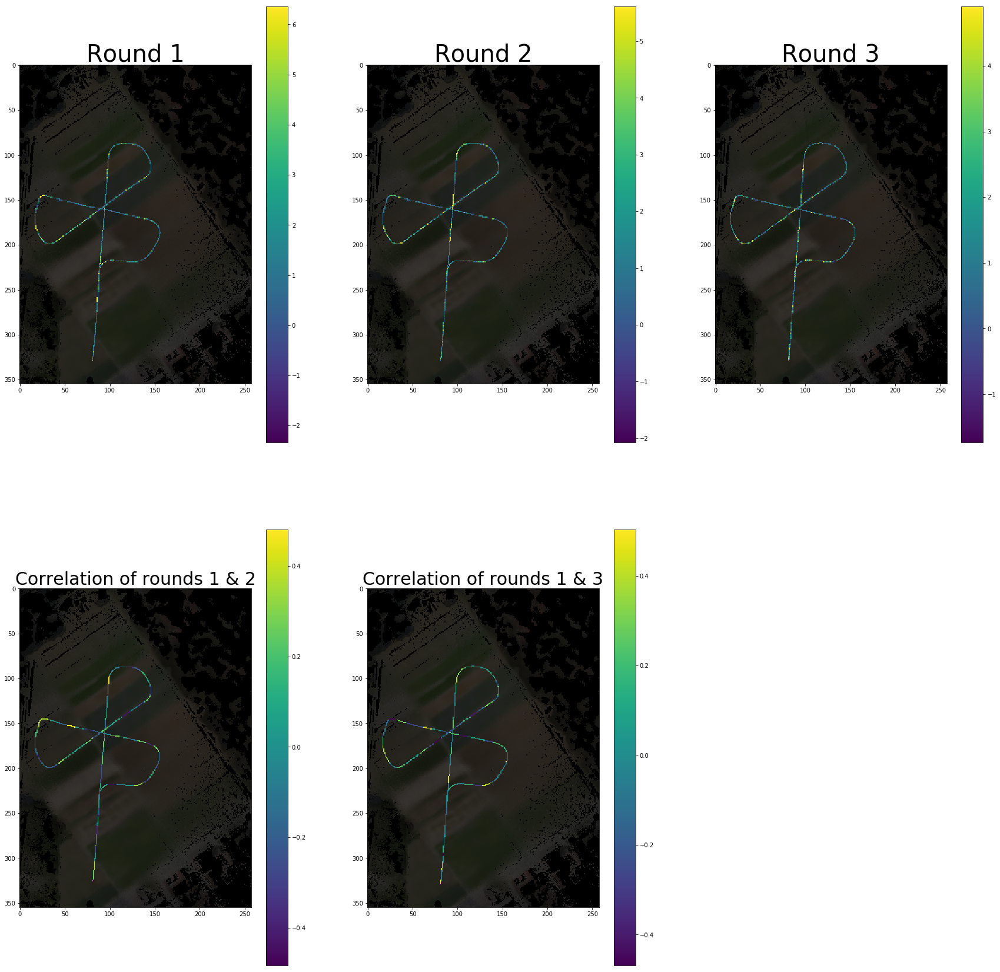

In [ ]:
fig = figure(figsize = (30,30), facecolor='white')

ax = plt.subplot(2, 3, 1)
ax.set_title('Round 1', fontsize=40)
_ = map_round(ax, field_map, spike_rates, camera_positions, 0, 0, start_frames, end_frames)

ax = plt.subplot(2, 3, 2)
ax.set_title('Round 2', fontsize=40)
_ = map_round(ax, field_map, spike_rates, camera_positions, 0, 1, start_frames, end_frames)

ax = plt.subplot(2, 3, 3)
ax.set_title('Round 3', fontsize=40)
_ = map_round(ax, field_map, spike_rates, camera_positions, 0, 2, start_frames, end_frames)

ax = plt.subplot(2, 3, 4)
ax.set_title('Correlation of rounds 1 & 2', fontsize=30)
_ = map_time_slices(ax, field_map, matched_round_points, corrs, round_num = 1)

ax = plt.subplot(2, 3, 5)
ax.set_title('Correlation of rounds 1 & 3', fontsize=30)
_ = map_time_slices(ax, field_map, matched_round_points, corrs, round_num = 2)

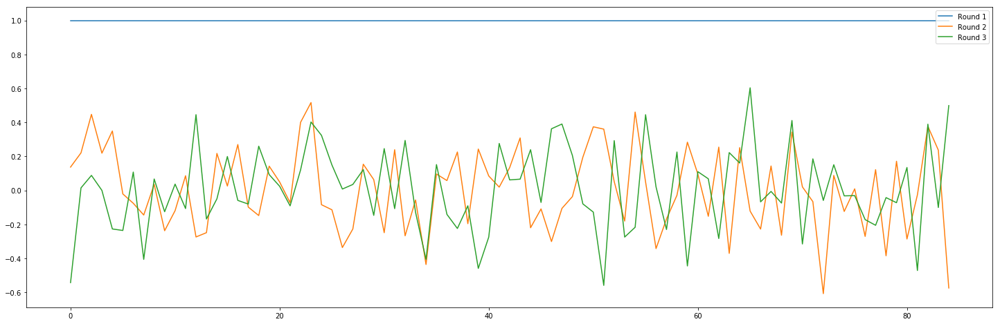

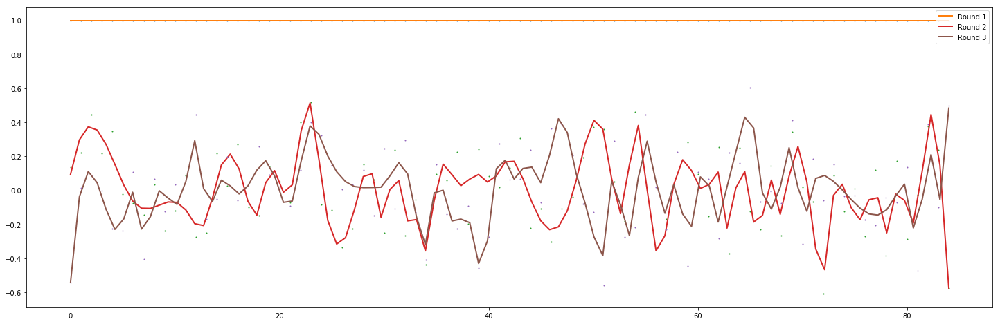

In [ ]:
plot_synced_time_slices(camera_positions, flight_num = 0, base_round_num = 0, distance = 10)

## Increase bin size of spike rate

In [ ]:
def mean_bins(matched_neuro_data):
    means = []
    
    for round_num in range(len(matched_neuro_data)):
        round_means = []
        
        for part_num in range(len(matched_neuro_data[round_num])):          
            part = matched_neuro_data[round_num][part_num]
            
            if part == []:
                round_means.append(0)
            else:
                round_means.append(np.mean(part))
            
        means.append(round_means)
        
    return means

def get_windowed_data(data, window_size):
    if type(data[0]) is not list:
        return [data[x : x + window_size] for x in range(0, len(data) - (window_size - 1), window_size)]
    
    windowed_data = []
    
    for round_num in range(len(data)):
        windowed_round = [data[round_num][x : x + window_size]
                          for x in range(0, len(data[round_num]) - (window_size - 1), window_size)]
        
        windowed_data.append(windowed_round)
        
    return windowed_data

def map_bin_time_slices(ax, field_map, matched_windowed_round_points, corrs, round_num, show_colorbar = True):
    delta_x = 187 # distance to leftmost x-coordinate from origin on field
    delta_y = 297 # distance to topmost y-coordinate from origin on field
    
    ax.imshow(field_map / 4)
    
    corr_overlay = np.full((field_map.shape[0], field_map.shape[1]), np.nan)
    
    for window_num in range(len(matched_windowed_round_points[round_num])):
        corr = corrs[round_num][window_num]
        
        for part_num in range(len(matched_windowed_round_points[round_num][window_num])):
            for point in matched_windowed_round_points[round_num][window_num][part_num]:
                x = int(delta_x + point[0])
                y = int(delta_y - point[1])

                corr_overlay[y, x] = corr
        
    current_cmap = matplotlib.cm.get_cmap()
    current_cmap.set_bad(alpha=0)    
    
    vmin, vmax = get_vmin_vmax(corr_overlay)
    im = ax.imshow(corr_overlay, vmin = vmin, vmax = vmax)
    
    if show_colorbar:
        plt.colorbar(im)
        
    return corr_overlay

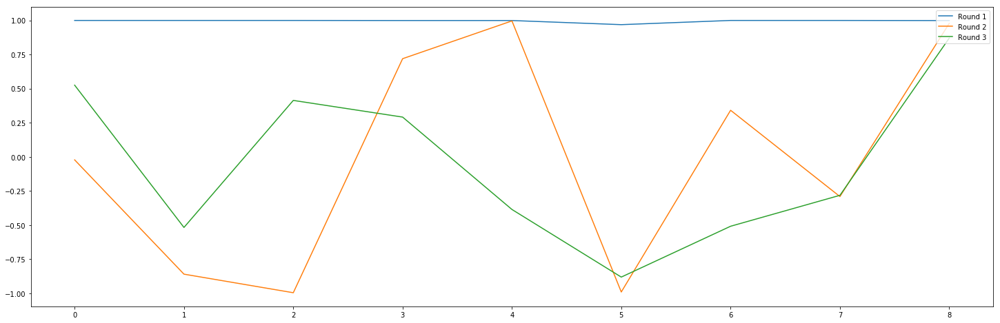

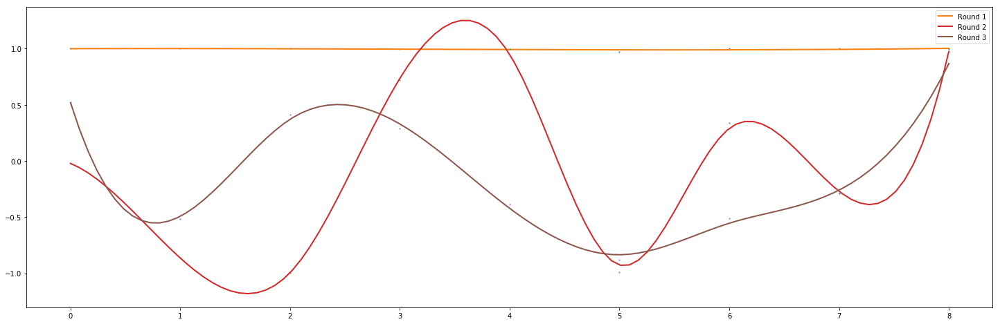

In [ ]:
window_size = 3
distance = 30       # 30 = about the same as window with 50 frames
smoothness = 0.01
smooth_points = 100
labels = ["Round 1", "Round 2", "Round 3"]

points = get_points(camera_positions, flight_num)
ordered_points, mean_points, ordered_neuro = create_mean_parts(distance, points, spike_rates, 0)
base_round_points, base_round_mean, base_round_neuro = get_base_round(base_round_num, start_frames, end_frames,
                                                                      ordered_points, mean_points, ordered_neuro)
matched_round_points, matched_round_neuro_data = match_rounds(flight_num, start_frames, end_frames, points,
                                                              base_round_mean, spike_rates)

base_round_neuro = [base_round_neuro.copy() for i in range(len(matched_round_neuro_data))]

matched_round_neuro_data = mean_bins(matched_round_neuro_data)
base_round_neuro = mean_bins(base_round_neuro)

matched_windowed_round_neuro_data = get_windowed_data(matched_round_neuro_data, window_size)
base_windowed_round_neuro = get_windowed_data(base_round_neuro, window_size)
matched_windowed_round_points = get_windowed_data(matched_round_points, window_size)

corrs = correlate_rounds(base_windowed_round_neuro, matched_windowed_round_neuro_data)

Visualizer.plot(corrs, labels = labels)
Visualizer.plot(corrs, labels = labels, smoothness = smoothness, smooth_points = smooth_points)

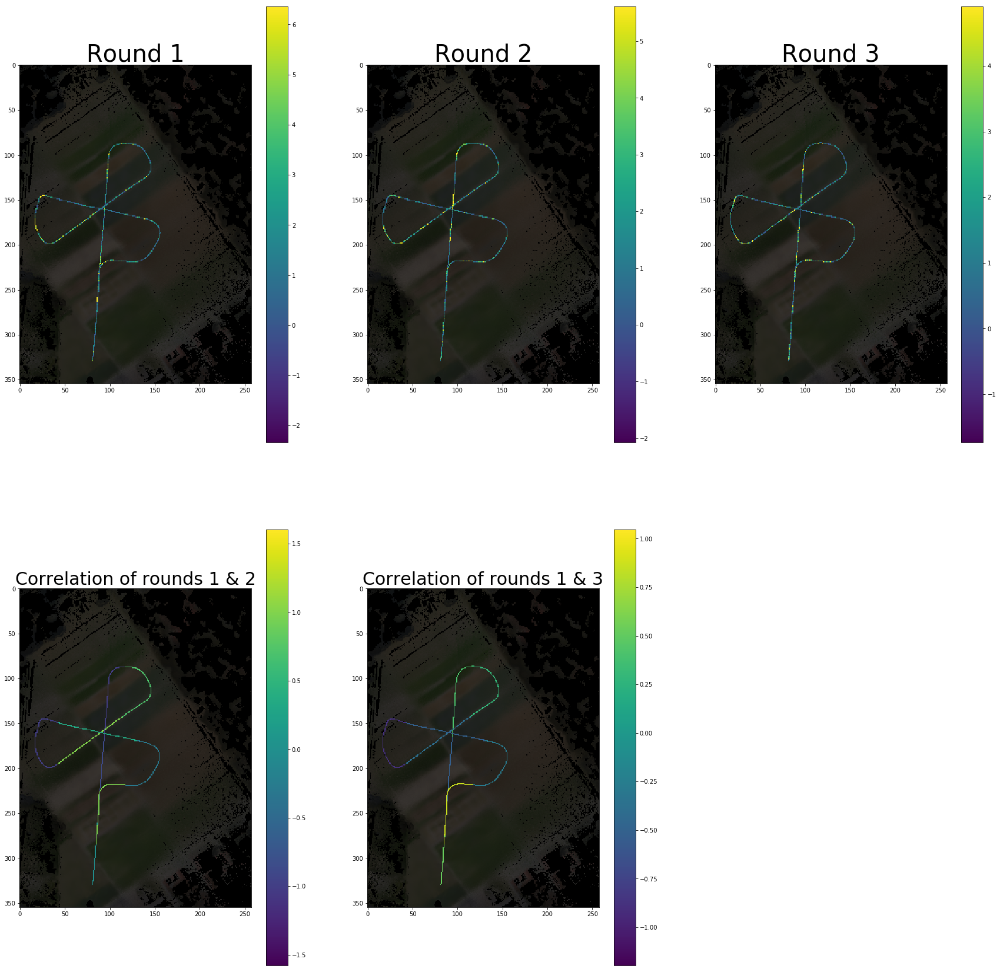

In [ ]:
fig = figure(figsize = (30,30), facecolor='white')

ax = plt.subplot(2, 3, 1)
ax.set_title('Round 1', fontsize=40)
_ = map_round(ax, field_map, spike_rates, camera_positions, 0, 0, start_frames, end_frames)

ax = plt.subplot(2, 3, 2)
ax.set_title('Round 2', fontsize=40)
_ = map_round(ax, field_map, spike_rates, camera_positions, 0, 1, start_frames, end_frames)

ax = plt.subplot(2, 3, 3)
ax.set_title('Round 3', fontsize=40)
_ = map_round(ax, field_map, spike_rates, camera_positions, 0, 2, start_frames, end_frames)

ax = plt.subplot(2, 3, 4)
ax.set_title('Correlation of rounds 1 & 2', fontsize=30)
_ = map_bin_time_slices(ax, field_map, matched_windowed_round_points, corrs, round_num = 1)

ax = plt.subplot(2, 3, 5)
ax.set_title('Correlation of rounds 1 & 3', fontsize=30)
_ = map_bin_time_slices(ax, field_map, matched_windowed_round_points, corrs, round_num = 2)

## Sliding Window Correlation

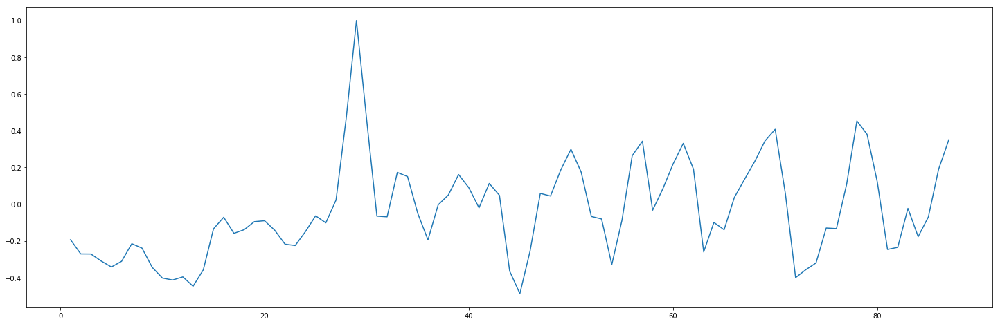

In [ ]:
ordered_points, mean_points, ordered_neuro = create_mean_parts(distance, points, spike_rates, 0)
base_round_points, base_round_mean, base_round_neuro = get_base_round(base_round_num, start_frames, end_frames,
                                                                      ordered_points, mean_points, ordered_neuro)
matched_round_points, matched_round_neuro_data = match_rounds(flight_num, start_frames, end_frames, points,
                                                              base_round_mean, spike_rates)

matched_round_neuro_data = mean_bins(matched_round_neuro_data)
base_round_neuro = mean_bins([base_round_neuro])[0]

rounds = [0 for i in range(len(base_round_neuro))]
for i in range(len(matched_round_neuro_data)):
    rounds.extend(matched_round_neuro_data[i])
    
rounds.append([0 for i in range(len(base_round_neuro))])

corrs = Correlation.swc(rounds, len(base_round_neuro), 2 * len(base_round_neuro))

Visualizer.plot(corrs)

## All flights on 3rd September, 2018

In [ ]:
start_rounds, end_rounds = get_round_start_end(camera_positions)

In [ ]:
def time_slices(distance, flight_num, base_round_num, start_frames, end_frames):    
    points = get_points(camera_positions, flight_num)
    start_frames, end_frames = get_round_start_end(camera_positions, flight_num)
    
    ordered_points, mean_points, ordered_neuro = create_mean_parts(distance, points, spike_rates, flight_num)
    base_round_points, base_round_mean, base_round_neuro = get_base_round(base_round_num, start_frames, end_frames,
                                                                          ordered_points, mean_points,
                                                                          ordered_neuro)
    matched_round_points, matched_round_neuro_data = match_rounds(flight_num, start_frames, end_frames, points,
                                                                  base_round_mean, spike_rates)    
    eq_base_round_neuro, eq_matched_round_neuro = equalize_round_lengths(base_round_neuro,
                                                                         matched_round_neuro_data)    
    corrs = correlate_rounds(eq_base_round_neuro, eq_matched_round_neuro)
    
    return corrs, matched_round_points


def time_slices_windowed(window_size, distance, flight_num, base_round_num, start_frames, end_frames):
    points = get_points(camera_positions, flight_num)
    start_frames, end_frames = get_round_start_end(camera_positions, flight_num)
    
    ordered_points, mean_points, ordered_neuro = create_mean_parts(distance, points, spike_rates, flight_num)
    base_round_points, base_round_mean, base_round_neuro = get_base_round(base_round_num, start_frames,
                                                                          end_frames, ordered_points, mean_points,
                                                                          ordered_neuro)
    matched_round_points, matched_round_neuro_data = match_rounds(flight_num, start_frames, end_frames, points,
                                                                  base_round_mean, spike_rates)

    base_round_neuro = [base_round_neuro.copy() for i in range(len(matched_round_neuro_data))]

    matched_round_neuro_data = mean_bins(matched_round_neuro_data)
    base_round_neuro = mean_bins(base_round_neuro)

    matched_windowed_round_neuro_data = get_windowed_data(matched_round_neuro_data, window_size)
    base_windowed_round_neuro = get_windowed_data(base_round_neuro, window_size)
    matched_windowed_round_points = get_windowed_data(matched_round_points, window_size)

    corrs = correlate_rounds(base_windowed_round_neuro, matched_windowed_round_neuro_data)
    
    return corrs, matched_windowed_round_points

def smooth(series, smooth_points, smoothness):
    x = range(len(series))
    y = series
    
    x_int = np.linspace(x[0], x[-1], smooth_points if smooth_points > 0 else len(series))
    tck = interpolate.splrep(x, y, k = 3, s = smoothness)    
    y_int = interpolate.splev(x_int, tck, der = 0)
    
    return x_int, y_int

def swc_windowed(ax, distance, flight_num, rolling_mean_window = -1, smoothness = 0):
    points = get_points(camera_positions, flight_num)
    start_frames, end_frames = get_round_start_end(camera_positions, flight_num)
    ordered_points, mean_points, ordered_neuro = create_mean_parts(distance, points, spike_rates, flight_num)
    
    round_len = 0
    
    for round_num in range(len(start_frames)):
        base_round_points, base_round_mean, base_round_neuro = get_base_round(round_num, start_frames, end_frames,
                                                                              ordered_points, mean_points,
                                                                              ordered_neuro)
        
        matched_round_points, matched_round_neuro_data = match_rounds(flight_num, start_frames, end_frames, points,
                                                                      base_round_mean, spike_rates)
            
        matched_round_neuro_data = mean_bins(matched_round_neuro_data)
        base_round_neuro = mean_bins([base_round_neuro])[0]
        
        # offset = len(base_round_neuro) would lead to first correlation value nan
        offset = len(base_round_neuro) - 1
        
        rounds = [0 for i in range(offset)]
        for i in range(len(matched_round_neuro_data)):
            rounds.extend(matched_round_neuro_data[i])

        rounds.extend([0 for i in range(offset)])
        
        start = offset + (round_num * len(base_round_neuro))        
        corrs = Correlation.swc(rounds, start, start + len(base_round_neuro)).numpy()
        
        if rolling_mean_window > 0:
            corrs = pd.Series(corrs).rolling(window = rolling_mean_window).mean()
            corrs = corrs.iloc[rolling_mean_window - 1 : ].values
        
        if smoothness > 0:
            corrs = np.nan_to_num(corrs)        
            x, y = smooth(corrs, len(corrs), smoothness)
            
            ax.plot(x, y, label = "Round {}".format(round_num + 1))
        else:
            ax.plot(corrs, label = "Round {}".format(round_num + 1))
            
        if round_len == 0:
            round_len = len(base_round_neuro) - 1
        
    ax.legend(loc='upper right')
    
    plt.axvspan(0, round_len, color='red', alpha=0.2)
    
    for round_num in range(len(start_frames) - 1):
        plt.axvspan(round_len + round_num * round_len, round_len + (round_num + 1) * round_len, color='green',
                    alpha=0.2)
    
    plt.axvspan(len(start_frames) * round_len, round_len + len(start_frames) * round_len, color='red', alpha=0.2)
    
    plt.show()
    
def plot(ax, time_series, labels, smoothness = 0):
    for series_num in range(len(time_series)):
        series = time_series[series_num]
        
        if smoothness > 0:
            corrs = np.nan_to_num(series)        
            x, y = smooth(series, len(series), smoothness)
            
            ax.plot(x, y, label = labels[series_num])
        else:
            ax.plot(series, label = labels[series_num])
    
    ax.legend(loc='upper right')
    
def _add_mean_fig(fig, gs, figs, row_num, row_title):
    ax = fig.add_subplot(gs[row_num, 0])
    ax.set_title("Mean", fontsize=25)
    ax.imshow(np.mean(figs, axis = 0))
    
    ax.annotate(row_title, (0, 0.5), xytext=(-45, 0), ha='right', va='center',
                size=25, rotation=90, xycoords='axes fraction',
                textcoords='offset points')

def show_all_flights(time_slice_base_round, time_slice_distance, windowed_time_slice_distance, window_size,
                     auto_corr_distance, rolling_mean_window = -1, smoothness = 0):
    for flight_num in range(len(flight_labels)):
        fig = figure(constrained_layout=True, figsize = (30,30), facecolor='white')
        fig.suptitle(flight_labels[flight_num], fontsize=50, fontweight='bold', y=1.08)

        rows = 6
        cols = len(start_rounds[flight_num]) + 1

        gs = GridSpec(rows, cols, figure=fig)

        time_slice_corrs, matched_round_points = time_slices(time_slice_distance, flight_num,
                                                             time_slice_base_round, start_rounds[flight_num],
                                                             end_rounds[flight_num])
        time_slice_corrs_windowed, matched_windowed_round_points = time_slices_windowed(window_size,
                                                                        windowed_time_slice_distance,
                                                                        flight_num, time_slice_base_round,
                                                                        start_rounds[flight_num],
                                                                        end_rounds[flight_num])
        
        figs = []
        
        for round_num in range(1, cols):
            ax = fig.add_subplot(gs[0, round_num])
            ax.set_title("Round {}".format(round_num), fontsize=25)                

            fig_map = map_round(ax, field_map, spike_rates, camera_positions, flight_num, round_num - 1,
                                start_rounds[flight_num],
                      end_rounds[flight_num])
            
            figs.append(fig_map)
            
        _add_mean_fig(fig, gs, figs, 0, "spike rate")
        figs = []

        next_col = 1
        for round_num in range(0, cols - 1):
            if round_num == time_slice_base_round:
                continue
            
            ax = fig.add_subplot(gs[1, next_col])
            ax.set_title("Correlation rounds {} x {}".format(time_slice_base_round + 1, round_num + 1),
                         fontsize=25)

            next_col += 1

            fig_map = map_time_slices(ax, field_map, matched_round_points, time_slice_corrs, round_num)
            
            figs.append(fig_map)
            
        _add_mean_fig(fig, gs, figs, 1, "windows ({} m)".format(time_slice_distance))
        figs = []
        
        ax = fig.add_subplot(gs[2, :])
        corr_labels = ["Round {} x {}".format(time_slice_base_round, i) for i in range(len(time_slice_corrs))]
        time_slice_corrs.pop(time_slice_base_round)
        corr_labels.pop(time_slice_base_round)
        plot(ax, time_slice_corrs, corr_labels, smoothness = 0)
        
        next_col = 1
        for round_num in range(0, cols - 1):
            if round_num == time_slice_base_round:
                continue
            
            ax = fig.add_subplot(gs[3, next_col])
            ax.set_title("Correlation rounds {} x {}".format(time_slice_base_round + 1, round_num + 1),
                         fontsize=25)
            
            next_col += 1

            fig_map = map_bin_time_slices(ax, field_map, matched_windowed_round_points, time_slice_corrs_windowed,
                                          round_num - 1)
            
            figs.append(fig_map)
            
        _add_mean_fig(fig, gs, figs, 3, "windows ({} x {} m)".format(window_size, windowed_time_slice_distance))
        
        ax = fig.add_subplot(gs[4, :])
        time_slice_corrs_windowed.pop(time_slice_base_round)
        plot(ax, time_slice_corrs_windowed, corr_labels, smoothness = 0)
        
        ax = fig.add_subplot(gs[5, :])
        ax.set_title("SWC ({} m)".format(auto_corr_distance), fontsize=25)
        swc_windowed(ax, auto_corr_distance, flight_num, rolling_mean_window, smoothness)

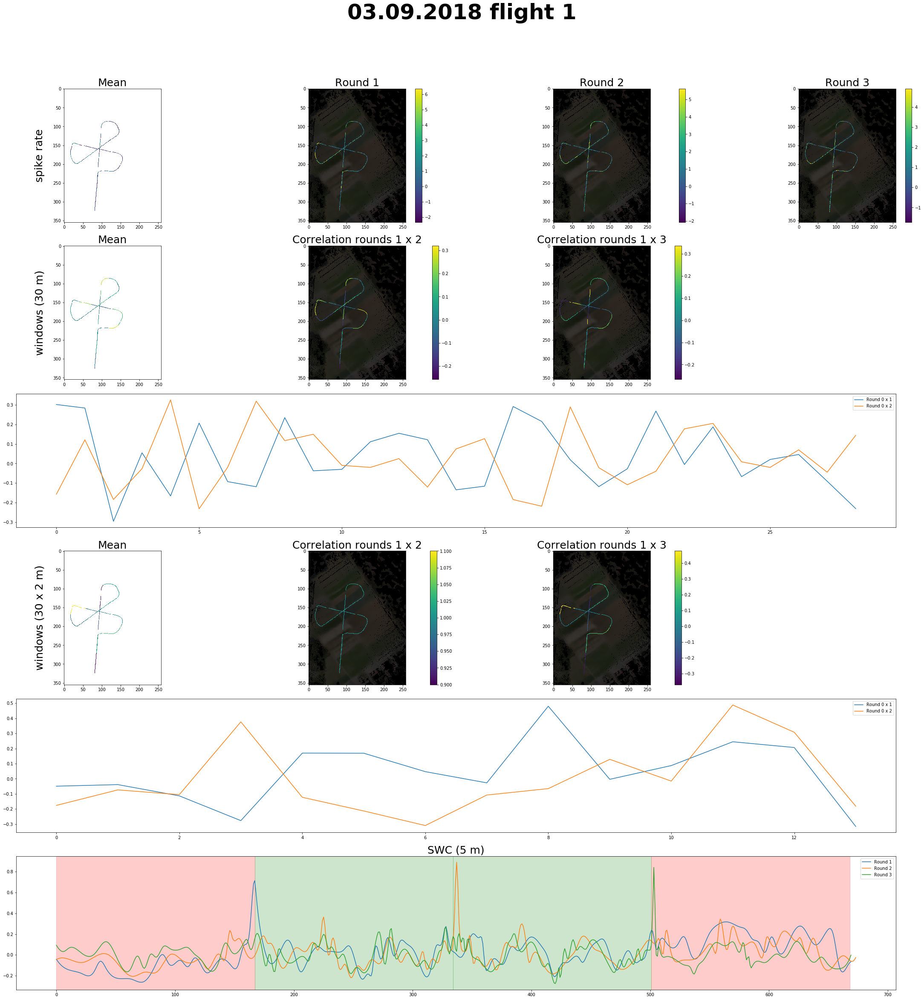

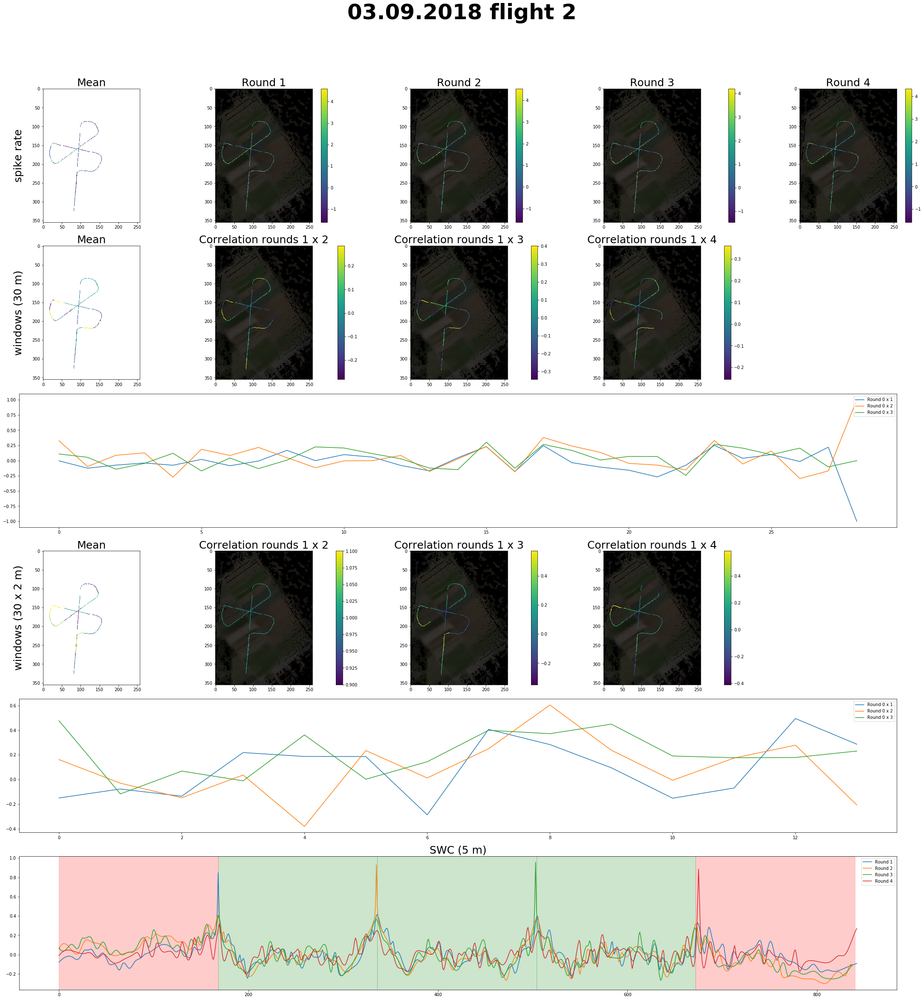

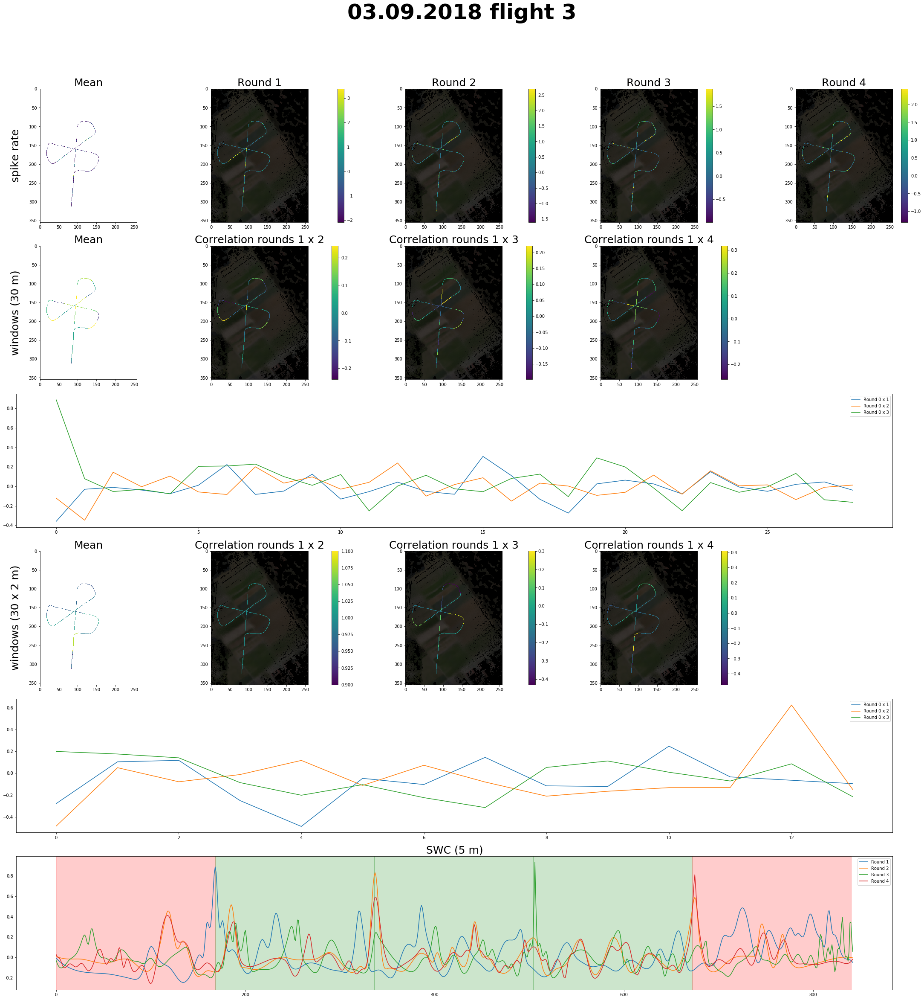

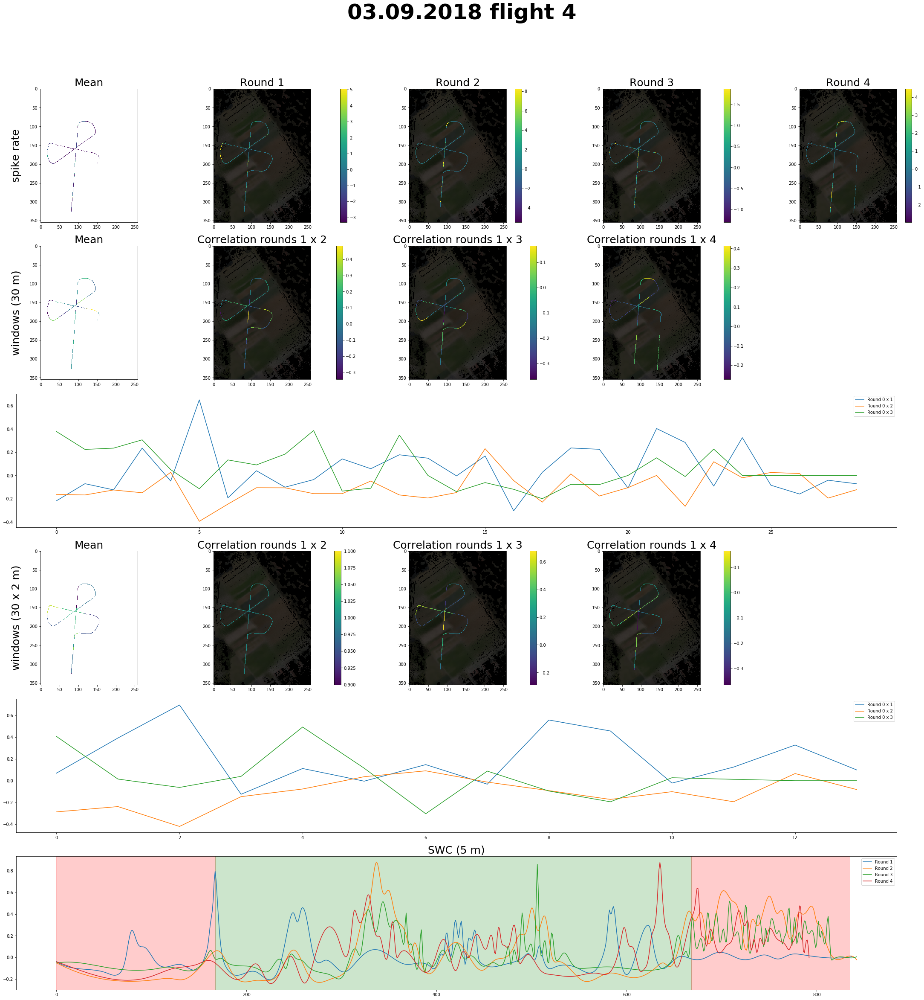

In [ ]:
show_all_flights(time_slice_base_round = 0, time_slice_distance = 30, windowed_time_slice_distance = 2,
                 window_size = 30, auto_corr_distance = 5, smoothness = 1)

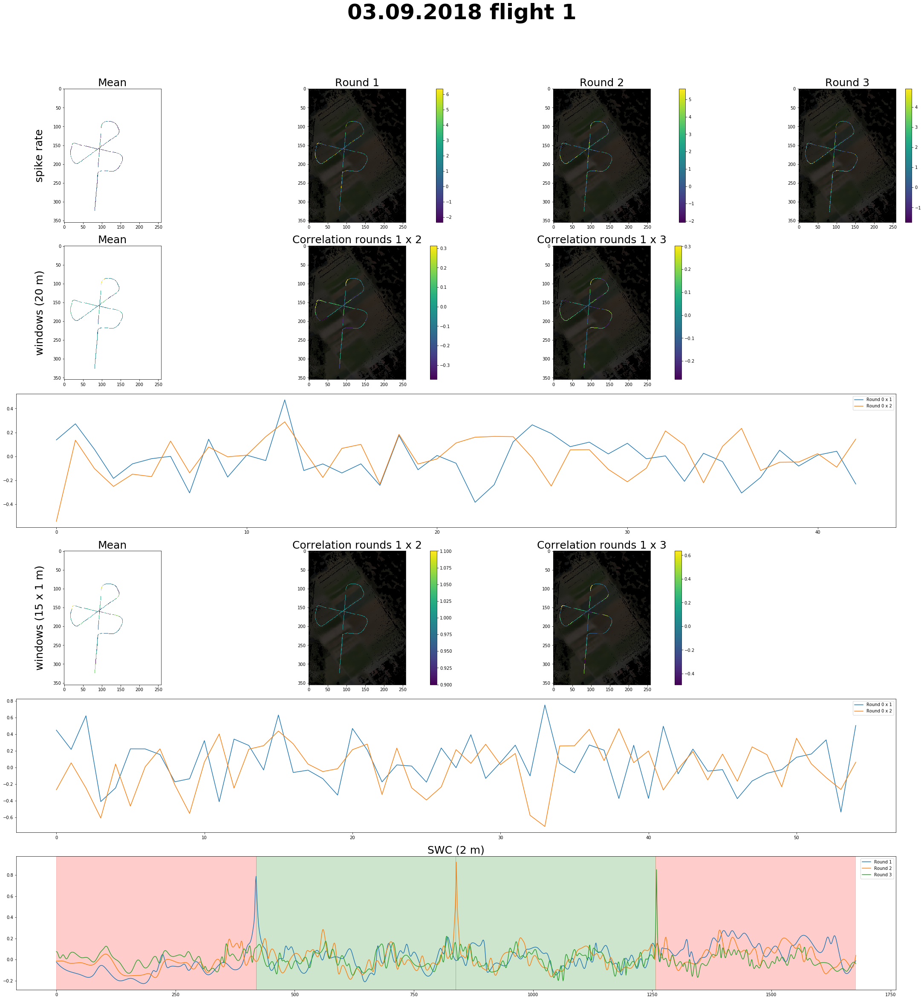

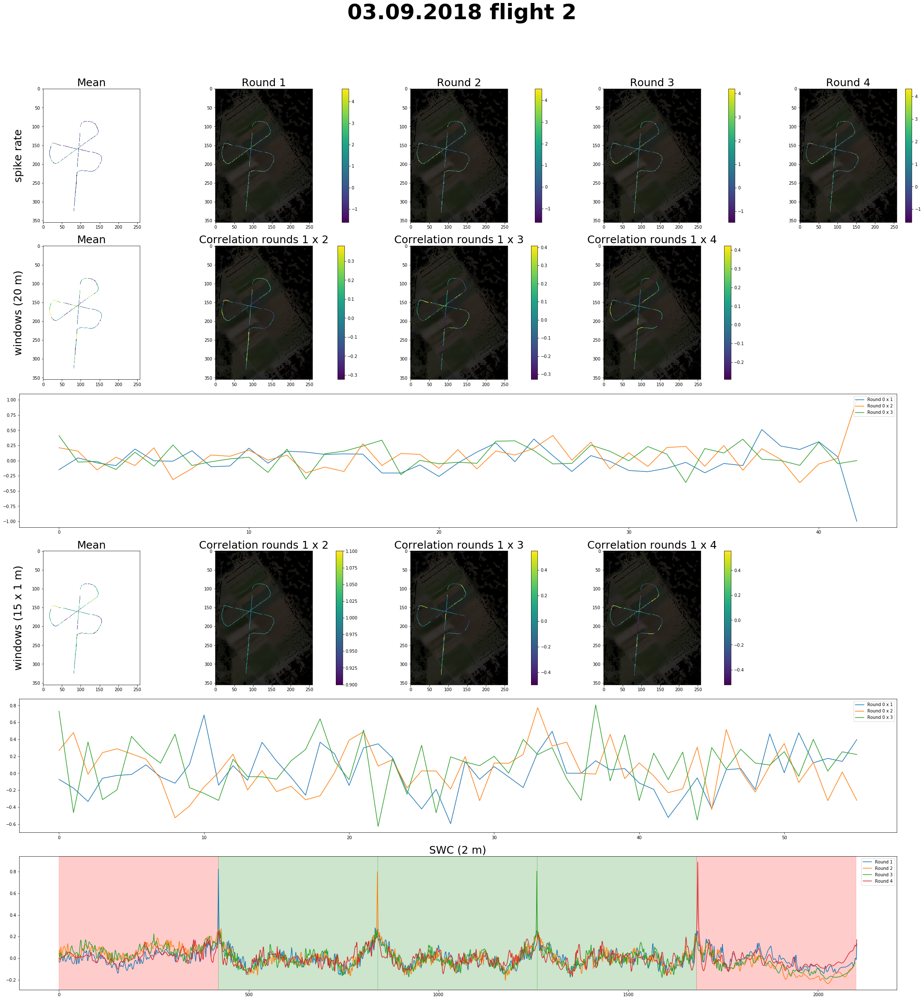

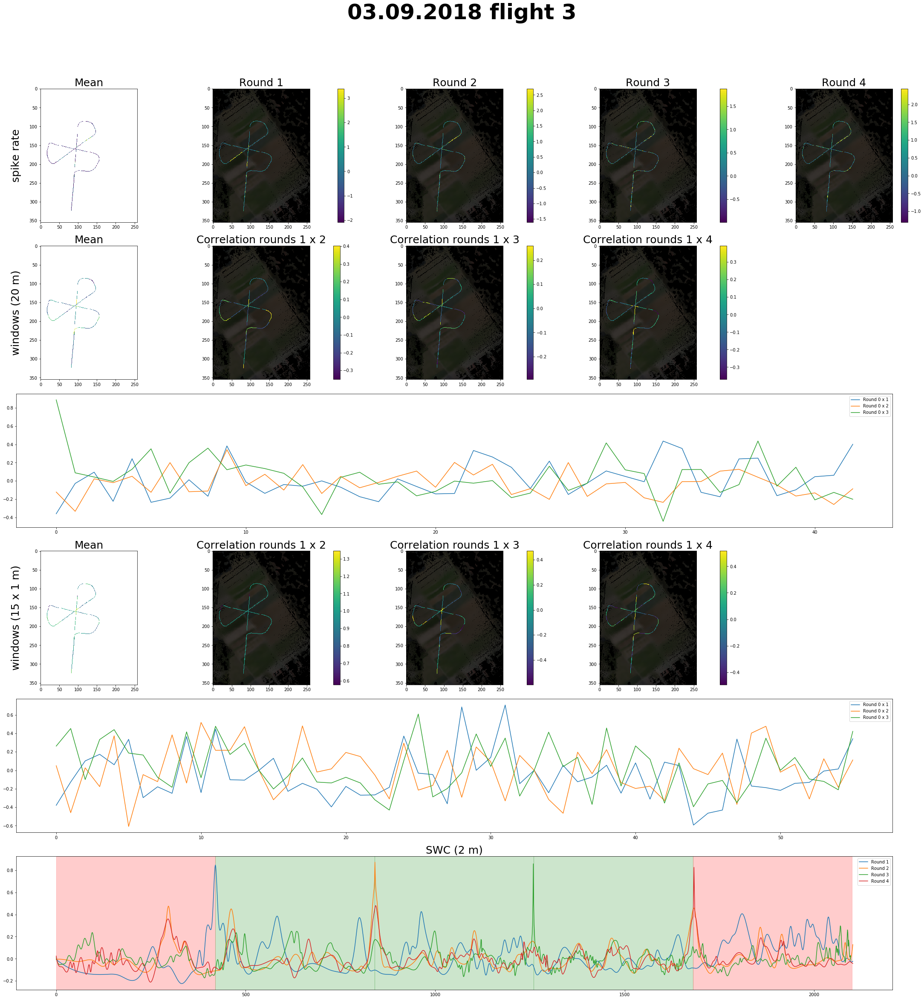

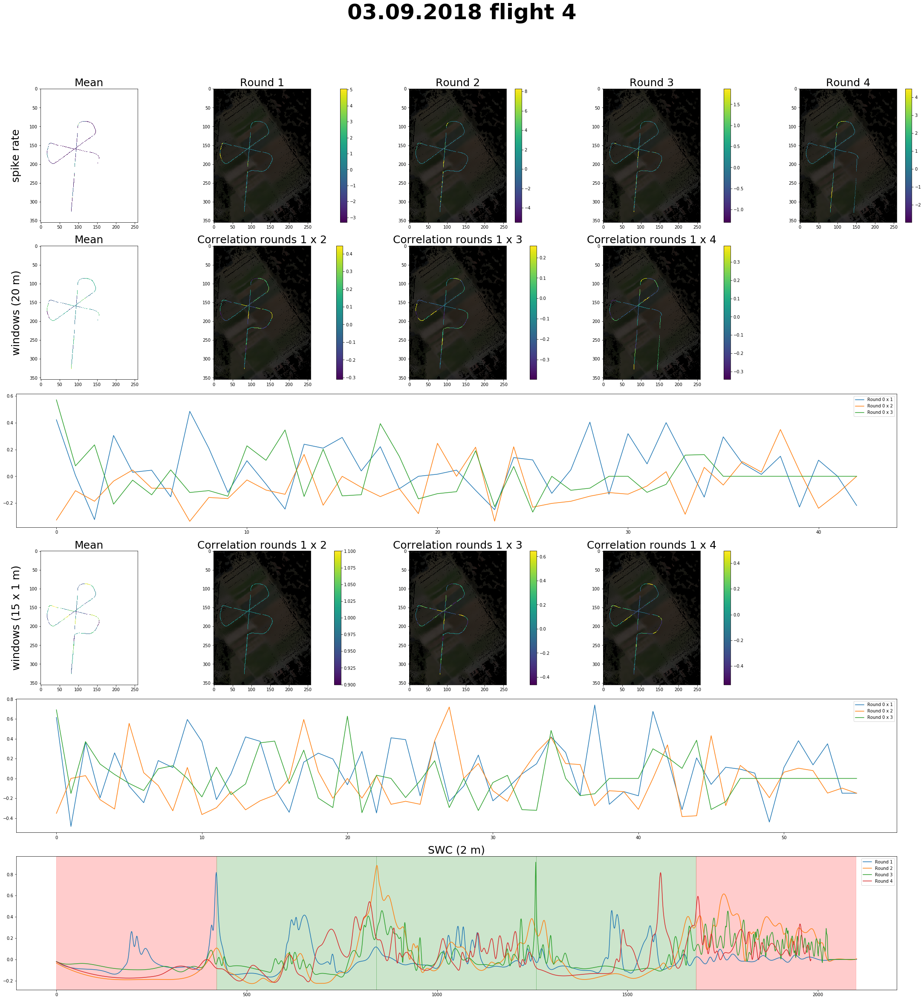

In [ ]:
show_all_flights(time_slice_base_round = 0, time_slice_distance = 20, windowed_time_slice_distance = 1,
                 window_size = 15, auto_corr_distance = 2, smoothness = 1)

# Mean spike rate of all rounds

## Spike rate with 0.1 second intervall

In [ ]:
def plot_mean_raw_spike_rate():
    all_rounds = []
    
    for flight_num in range(len(spike_rates)):
        for round_num in range(len(start_rounds[flight_num])):
            r = spike_rates[flight_num][start_rounds[flight_num][round_num] : end_rounds[flight_num][round_num]]
            all_rounds.append(r)
    
    # cut endings of rounds such that all rounds are equally long
    min_length = min(len(l) for l in all_rounds)
    all_rounds = [l[ : min_length] for l in all_rounds]
    
    rounds = np.array(all_rounds)
    
    mean = np.mean(rounds, axis = 0)
    std = np.std(rounds, axis = 0)
    
    plt.figure(figsize=(15, 6))
    plt.plot(mean, 'k-')
        
    x = np.linspace(0, len(mean) - 1, len(mean))
    plt.fill_between(x, mean - std, mean + std, alpha = 0.5)
    
    plt.xlabel("time in 0.1 second interval", fontsize = 20)
    plt.ylabel("spike rate", fontsize = 20)

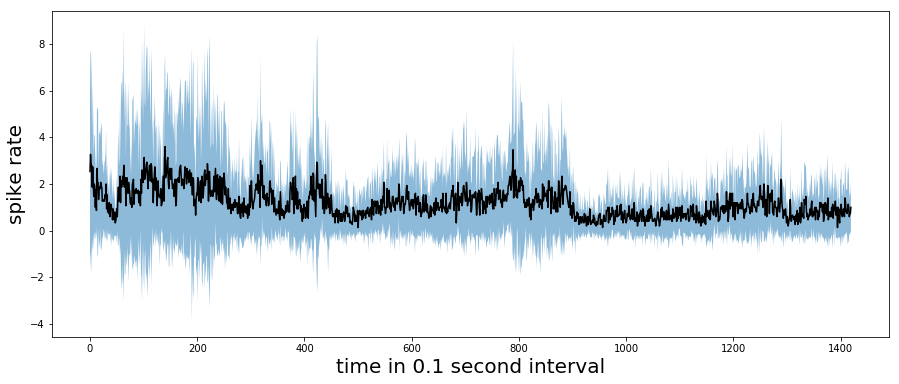

In [ ]:
plot_mean_raw_spike_rate()

## Spike rate with distance aggregation

__Functions from section 4 are used!__

In [ ]:
def plot_with_std(fig, gs, row, title, rounds):
    rounds = np.array(rounds)
    
    mean = np.mean(rounds, axis = 0)
    std = np.std(rounds, axis = 0)
    
    ax = fig.add_subplot(gs[row, 0])
    ax.set_title(title, fontsize=25)
    ax.plot(mean, 'k-')
        
    x = np.linspace(0, len(mean) - 1, len(mean))
    ax.fill_between(x, mean - std, mean + std, alpha = 0.5)
    
    return mean

def show_mean_spike_rate(distance):
    max_rounds = len(max(start_rounds, key = len))
    
    mean_rounds = []
    std_rounds = []
    
    base_round_mean = None
    matched_rounds = []   
    
    for flight_num in range(len(spike_rates)):
        points = get_points(camera_positions, flight_num)
        start_frames, end_frames = get_round_start_end(camera_positions, flight_num)
    
        ordered_points, mean_points, ordered_neuro = create_mean_parts(distance, points, spike_rates, flight_num)
        
        if base_round_mean is None:
            base_round_points , base_round_mean, _ = get_base_round(0, start_frames, end_frames, ordered_points,
                                                                    mean_points, ordered_neuro)
        
        _, matched_round_neuro_data = match_rounds(flight_num, start_frames, end_frames, points, base_round_mean,
                                                   spike_rates)
        
        matched_round_neuro_data = mean_bins(matched_round_neuro_data)
        matched_rounds.append(matched_round_neuro_data)
        
        
    all_rounds = []
    
    fig = figure(constrained_layout=True, figsize = (30,30), facecolor='white')
    fig.suptitle("Mean spike rate ({}m interval)".format(distance), fontsize=50, fontweight='bold', y=1.08)

    cols = 1
    rows = max_rounds + 1
    gs = GridSpec(rows, cols, figure=fig)
    
    for round_num in range(max_rounds):
        flight_rounds = []
        
        for flight_num in range(len(matched_rounds)):
            if round_num < len(matched_rounds[flight_num]):
                flight_rounds.append(matched_rounds[flight_num][round_num])
                all_rounds.append(matched_rounds[flight_num][round_num])
        
        title = "Round {}".format(round_num + 1)
        plot_with_std(fig, gs, round_num, title, flight_rounds)
    
    mean = plot_with_std(fig, gs, 4, "All rounds", all_rounds)
    
    return base_round_points, mean

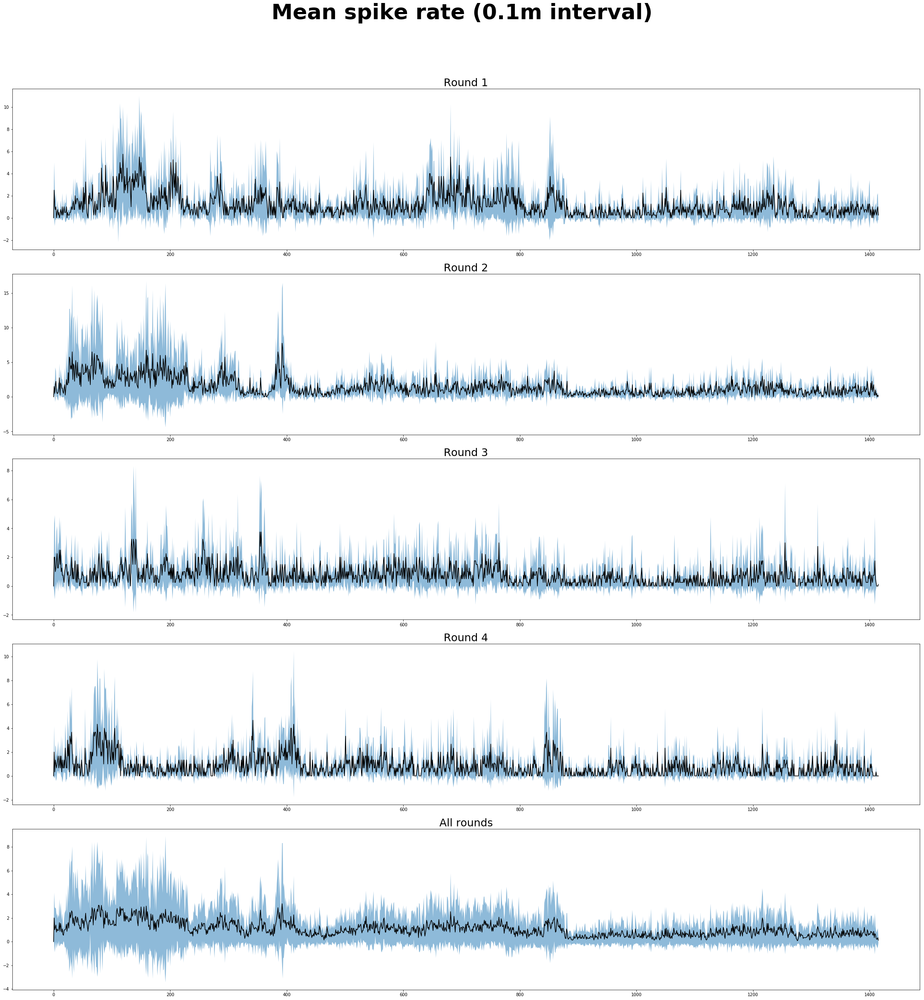

In [ ]:
_ = show_mean_spike_rate(0.1)

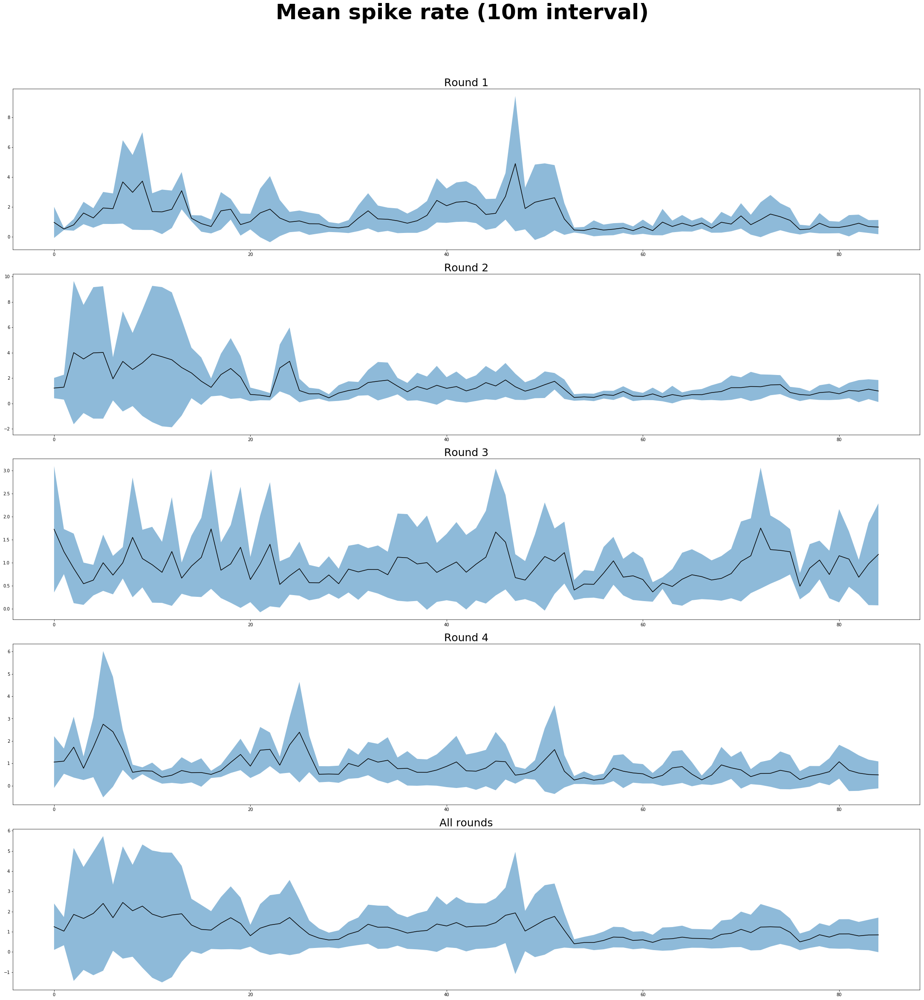

In [ ]:
_ = show_mean_spike_rate(10)

# Motor correlation with spike rate

__Verify that the recorded brain activity does not only reflect the copter's motor movements. Hence, there should be none or only a small correlation of the motor with the spike rate. On the other hand, a small correlation is to be expected because the motor moves the copter which influences the bee's vision which is recorded via its brain.__

In [ ]:
motor_speeds = []
accelerations = []

def load_motor_speeds(csv_file_path, voltage_column, start_frame):
    flight_speeds = [[], [], [], []] # motor 1 - 4
    flight_accel = [[], [], []]      # x, y, z
    
    with open(csv_file_path) as csvfile:
        reader = csv.reader(csvfile)        
    
        row_num = -1
        for row in reader:
            row_num += 1
            
            if row_num < start_frame:
                continue
                
            flight_speeds[0].append(int(row[voltage_column + 100]))
            flight_speeds[1].append(int(row[voltage_column + 101]))
            flight_speeds[2].append(int(row[voltage_column + 102]))
            flight_speeds[3].append(int(row[voltage_column + 103]))
            
            flight_accel[0].append(float(row[voltage_column + 21]))
            flight_accel[1].append(float(row[voltage_column + 22]))
            flight_accel[2].append(float(row[voltage_column + 23]))
            
    motor_speeds.append(np.array(flight_speeds))
    accelerations.append(np.array(flight_accel))

csv_path = Utils.get_path(["flights", "flight_2018_09_03#1"],
                          "030918_01_out_adc_synced.csv_spike_rates_0.1s_intervalls.csv")
load_motor_speeds(csv_path, voltage_column = 9, start_frame = 600)

csv_path = Utils.get_path(["flights", "flight_2018_09_03#2"],
                          "030918_2_out_adc_synced.csv_spike_rates_0.1s_intervalls.csv")
load_motor_speeds(csv_path, voltage_column = 3, start_frame = 600)

csv_path = Utils.get_path(["flights", "flight_2018_09_03#3"],
                          "030918_3_out_adc_synced.csv_spike_rates_0.1s_intervalls.csv")
load_motor_speeds(csv_path, voltage_column = 3, start_frame = 600)

csv_path = Utils.get_path(["flights", "flight_2018_09_03#4"],
                          "030918_4_out_adc_synced.csv_spike_rates_0.1s_intervalls.csv")
load_motor_speeds(csv_path, voltage_column = 3, start_frame = 600)

## Motor speed

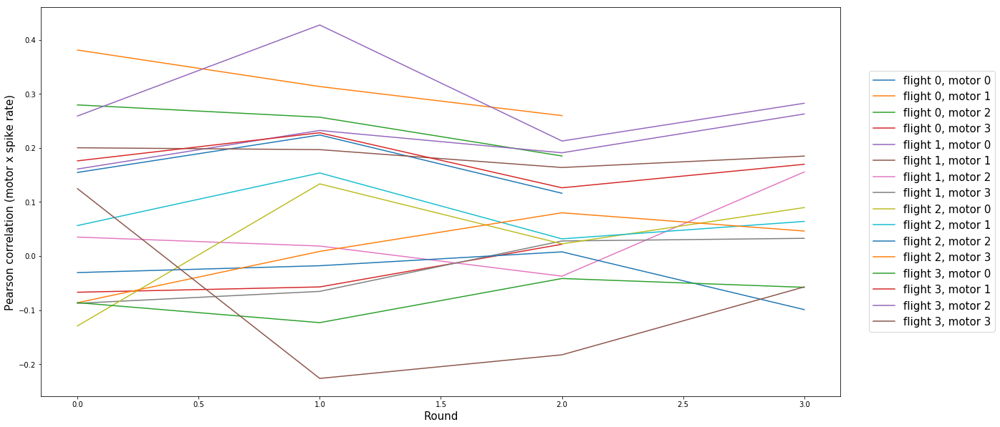

In [ ]:
def corr_motor_flights():
    fig = figure(figsize = (20,10))
    
    for flight_num in range(len(motor_speeds)):
        for motor_num in range(len(motor_speeds[0])):            
            motor = motor_speeds[flight_num][motor_num]
            corrs = []
            
            for round_num in range(len(start_rounds[flight_num])):                
                start = start_rounds[flight_num][round_num]
                end = end_rounds[flight_num][round_num]
                
                corr = Correlation._pearson(motor[start : end], spike_rates[flight_num][start : end])
                corrs.append(corr)
                                
            plt.plot(corrs, label = "flight {}, motor {}".format(flight_num, motor_num))
            
    plt.legend(loc='upper right', fontsize=15, bbox_to_anchor=(1.2, 0.85))
    plt.xlabel("Round", fontsize = 15)
    plt.ylabel("Pearson correlation (motor x spike rate)", fontsize = 15)
    plt.show()
    
corr_motor_flights()

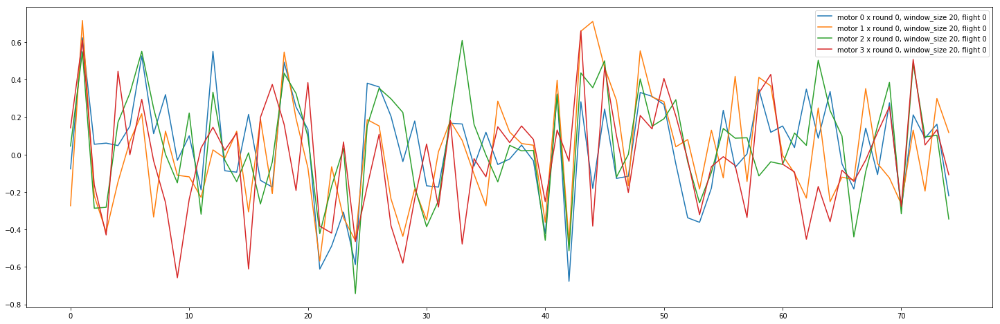

In [ ]:
def plot_motor_time_slice(window_size, flight_num, round_num):
    corrs = []
    
    for motor_num in range(4):
        motor_corrs = []
        
        for i in range(start_rounds[flight_num][round_num], end_rounds[flight_num][round_num], window_size):
            corr = Correlation._pearson(spike_rates[flight_num][i : i + window_size],
                                        motor_speeds[flight_num][motor_num][i : i + window_size])
            motor_corrs.append(corr)
            
        corrs.append(np.array(motor_corrs))
        
    labels = ["motor {} x round {}, window_size {}, flight {}".format(i, round_num, window_size, flight_num)
                                                                      for i in range(4)]
    Visualizer.plot(corrs, labels = labels)

plot_motor_time_slice(window_size = 20, flight_num = 0, round_num = 0)

## Acceleration

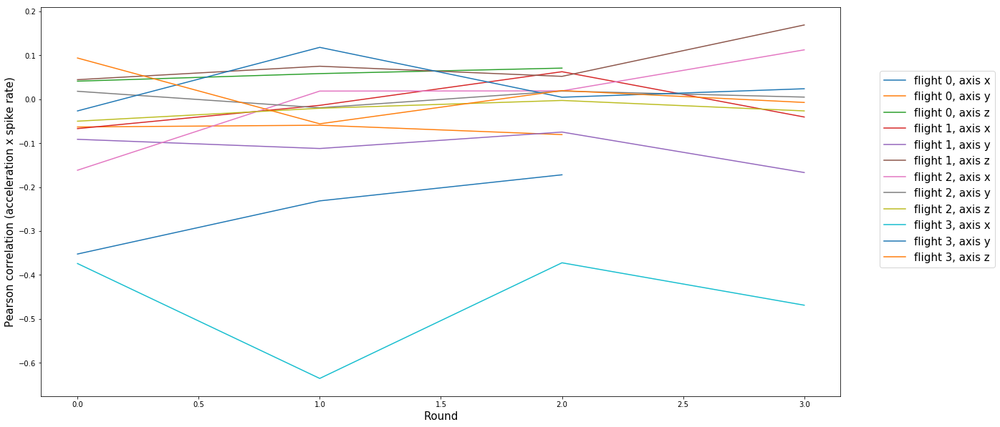

In [ ]:
def get_axis_name(axis):
    if axis == 0:
        return "x"
    elif axis == 1:
        return "y"
    else:
        return "z"

def corr_accel_flights():
    fig = figure(figsize = (20,10))
    
    for flight_num in range(len(accelerations)):
        for axis in range(3):
            accel = accelerations[flight_num][axis]
            corrs = []
            
            for round_num in range(len(start_rounds[flight_num])):                
                start = start_rounds[flight_num][round_num]
                end = end_rounds[flight_num][round_num]
                
                corr = Correlation._pearson(accel[start : end], spike_rates[flight_num][start : end])
                corrs.append(corr)
                                
            plt.plot(corrs, label = "flight {}, axis {}".format(flight_num, get_axis_name(axis)))
            
    plt.legend(loc='upper right', fontsize=15, bbox_to_anchor=(1.2, 0.85))
    plt.xlabel("Round", fontsize = 15)
    plt.ylabel("Pearson correlation (acceleration x spike rate)", fontsize = 15)
    plt.show()
    
corr_accel_flights()

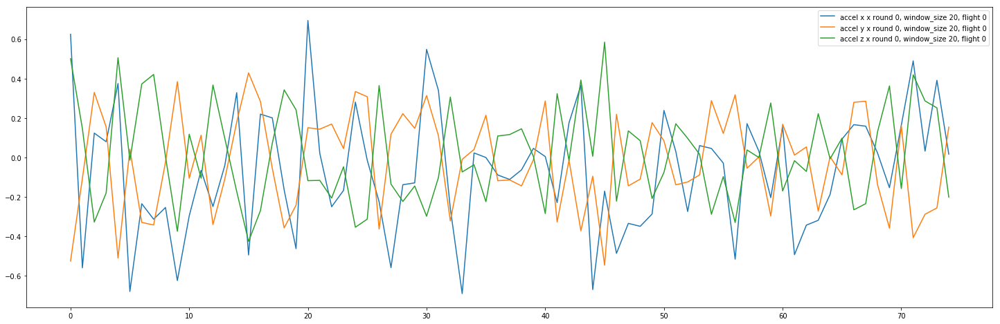

In [ ]:
def plot_accel_time_slice(window_size, flight_num, round_num):
    corrs = []
    
    for axis in range(3):
        accel_corrs = []
        
        for i in range(start_rounds[flight_num][round_num], end_rounds[flight_num][round_num], window_size):
            corr = Correlation._pearson(spike_rates[flight_num][i : i + window_size],
                                        accelerations[flight_num][axis][i : i + window_size])
            accel_corrs.append(corr)
            
        corrs.append(np.array(accel_corrs))
        
    labels = ["accel {} x round {}, window_size {}, flight {}".format(get_axis_name(i), round_num, window_size,
                                                                      flight_num) for i in range(3)]
    Visualizer.plot(corrs, labels = labels)

plot_accel_time_slice(window_size = 20, flight_num = 0, round_num = 0)